In [1]:
## IMPORT MODULES
%pylab inline
import os
import healpy
import polyspec as ps
import camb

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


### Introduction

In this tutorial we demonstrate how to use the ```PolySpec``` code to compute binned power spectra, bispectra and trispectra. PolySpec can also be used as a direct template estimator (e.g., for directly measuring $g_{\rm NL}^{\rm loc}$) -- see the other tutorial for details on how to use this. Below, we'll run ```PolySpec``` on some small toy problems. In practice, we would use much larger $N_{\rm side}$ and $\ell_{\rm max}$, and likely run the code on a high-performance cluster.

# 1. Set-up

### General Settings

In [2]:
# HEALPix settings
Nside = 128 # choosing a very low value for fast Bl & Tl - usually much larger!
lmax = 3*Nside-1

# Number of random iterations to create Fisher matrix
N_it = 10 # 10 to 20 is usually enough

# Number of simulations to use for testing
N_sim = 50

# Which code to use for harmonic transforms ["healpix" or "ducc"] 
# ducc is ~ 2x faster but needs to be installed before use
backend = 'ducc'

# Number of CPUs to use for multiprocessing (use as many as possible!)
N_cpus = 4

# Whether to include bins only partially satisfying triangle conditions
include_partial_triangles = False

# Galactic Mask
# Here, we'll use the common intensity/polarization component-separation mask for testing
root = '/mnt/home/ophilcox/ceph/planck_npipe/'
maskfileT = 'COM_Mask_CMB-common-Mask-Int_2048_R3.00.fits'
maskfileP = 'COM_Mask_CMB-common-Mask-Pol_2048_R3.00.fits'

# Whether to include polarization (i.e. E+B)
pol = True

### Fiducial Power and Noise Spectra
Below, we define a fiducial power and noise spectrum that we'll use to generate the testing simulations, and to weight the data. Here, we'll use compute this using CAMB, assuming the Planck 2018 cosmology. We generate all possible two-point functions: $TT,TE,TB,EE,EB,BB$. If we're not running in polarization mode, we just need $TT$ here. For simplicity, we'll ignore any instrument beam (except in the noise spectrum).

In [3]:
# Fiducial cosmological parameters
H0, ombh2, omch2, tau, ns, deltaR2, mnu = 67.32117, 0.0223828, 0.1201075, 0.05430842, 0.9660499, 2.100549e-9, 0.06

# Set-up CAMB
pars = camb.CAMBparams()
pars.set_cosmology(H0=H0, ombh2=ombh2, omch2=omch2, tau=tau, num_massive_neutrinos=1, mnu=mnu)
pars.InitPower.set_params(As=deltaR2, ns=ns, r=0, nt=0)
pars.AccurateBB=True
pars.AccuratePolarization=True
pars.DoLensing = True
pars.set_for_lmax(3500, lens_potential_accuracy=1, lens_margin=0, nonlinear=True, k_eta_fac=2.5);

# Compute power spectra
results = camb.get_results(pars);
clTT,clEE,clBB,clTE = results.get_cmb_power_spectra(pars,raw_cl=True,CMB_unit='K')['lensed_scalar'].T
# Define ell arrays
l = np.arange(lmax+1)

# Compute dictionary of signal C_ell
Cl_th = {}
if pol:
    Cl_th = {}
    Cl_th['TT'] = clTT[:len(l)]
    Cl_th['TE'] = clTE[:len(l)]
    Cl_th['EE'] = clEE[:len(l)]
    Cl_th['BB'] = clBB[:len(l)]
    Cl_th['TB'] = Cl_th['EB'] = 0.*clTT[:len(l)] # set to zero!
else:
    Cl_th['TT'] = clTT[:len(l)]
    
# Compute noise C_ell, including the beam factor
DeltaT = 60./60.*np.pi/180.*1e-6 # in K-radians
DeltaP = 60./60.*np.pi/180.*1e-6*np.sqrt(2) 
thetaFWHM = 5./60.*np.pi/180. # in radians
NlT = DeltaT**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>=2)
NlP = DeltaP**2*np.exp(l*(l+1)*thetaFWHM**2/(8.*np.log(2)))*(l>=2)
Nl_th = {}
if pol:
    Nl_th['TT'] = NlT
    Nl_th['TE'] = Nl_th['TB'] = Nl_th['EB'] = 0.*NlT
    Nl_th['EE'] = Nl_th['BB'] = NlP
else:
    Nl_th['TT'] = NlT

Let's plot the spectra:

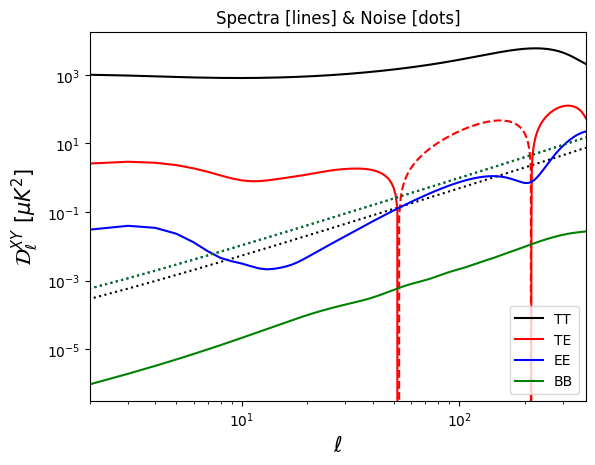

In [4]:
cols = ['k','r','b','g','purple','pink']
for i,f in enumerate(list(Cl_th.keys())):
    if np.sum(Cl_th[f]+Nl_th[f])==0: continue
    plt.plot(l,l*(l+1)/(2*np.pi)*Cl_th[f]*1e12,label=f,c=cols[i])
    plt.plot(l,-l*(l+1)/(2*np.pi)*Cl_th[f]*1e12,c=cols[i],ls='--')
    plt.plot(l,l*(l+1)/(2.*np.pi)*Nl_th[f]*1e12,c=cols[i],ls=':')
if pol:
    plt.xscale('log')
    plt.yscale('log')
else:
    plt.ylim([0,6200])
plt.legend()
plt.xlim([2,lmax])
plt.ylabel(r'$\mathcal{D}_\ell^{XY}$ [$\mu K^2$]',fontsize=15)
plt.xlabel(r'$\ell$',fontsize=15)
plt.title("Spectra [lines] & Noise [dots]");

### Load mask
For testing, we use the *Planck* common component-separation sky masks with 2-degree apodization applied.

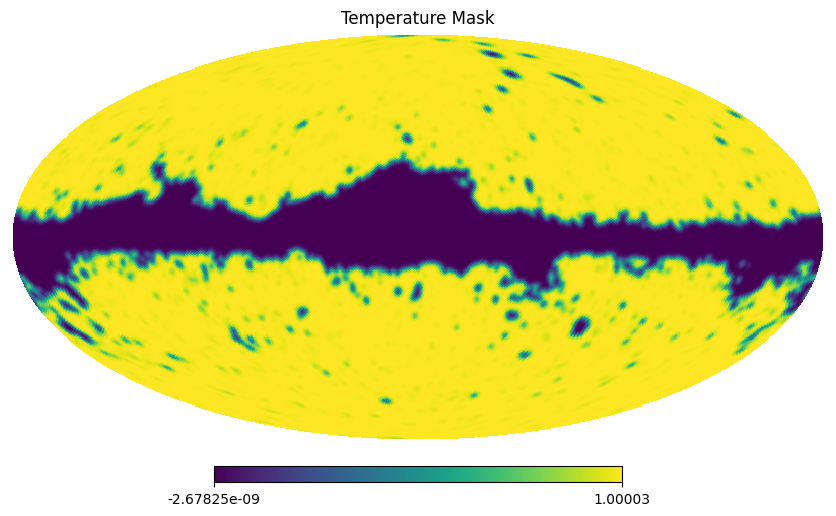

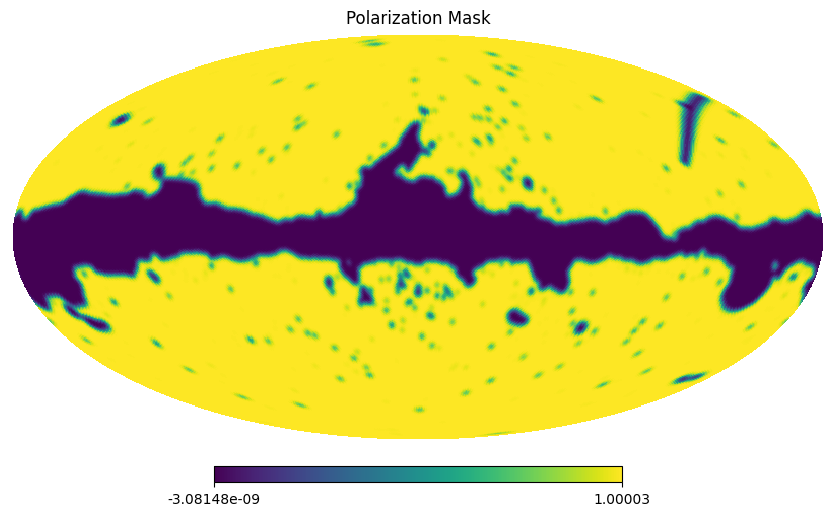

In [5]:
if not os.path.exists(root+maskfileT):
    os.system(r"wget -O {root+maskfileT} https://irsa.ipac.caltech.edu/data/Planck/release_3/ancillary-data/masks/COM_Mask_CMB-common-Mask-Int_2048_R3.00.fits")
if pol and not os.path.exists(root+maskfileP):
    os.system(r"wget -O {root+maskfileP} https://irsa.ipac.caltech.edu/data/Planck/release_3/ancillary-data/masks/COM_Mask_CMB-common-Mask-Pol_2048_R3.00.fits")

if pol:
    # Load and smooth masks
    maskT = healpy.smoothing(healpy.ud_grade(healpy.read_map(root+maskfileT,field=0),Nside),2*np.pi/180.)
    maskP = healpy.smoothing(healpy.ud_grade(healpy.read_map(root+maskfileP,field=0),Nside),2*np.pi/180.)
    # Define a combined mask vector for T,Q,U
    mask = np.array([maskT,maskP,maskP])
else:
    # Load and smooth masks
    mask = healpy.smoothing(healpy.ud_grade(healpy.read_map(root+maskfileT,field=0),Nside),2*np.pi/180.)[None]

healpy.mollview(mask[0],title='Temperature Mask')
if pol:
    healpy.mollview(mask[1],title='Polarization Mask')

### Initialize the PolySpec class

Let's start by calling the main PolySpec class. This contains a bunch of useful methods, including spherical harmonic transforms (via HEALPix or DUCC, depending on our choice of backend) and code to generate random simulations. We can also include the experimental beam here. (Note that the input data should *not* be beam-deconvolved -- this is performed in the weighting step). We can either run the code in polarization mode (`pol=True`) or scalar mode (`pol=False`). In the latter case, we only need to feed in temperature spectra.

In [6]:
## Define fiducial beam and signal+noise
# Note that the beam should include a pixel-window function if present in the data
if not pol:
    beam = [1.+0.*l]
else:
    beam = [1.+0.*l, 1.+0.*l] # Temperature and polarization
Cl_fiducial = {}
for f in Cl_th.keys(): Cl_fiducial[f] = beam[0]**2*Cl_th[f]+Nl_th[f]

# Define class, optionally including polarization
base = ps.PolySpec(Nside, Cl_fiducial, beam=beam, pol=pol, backend=backend, nthreads=N_cpus)

Next, we'll create some synthetic data with a known $C_\ell^{XY}$. We can optionally add a bispectrum term of the form $b_{\ell_1\ell_2\ell_3}=\beta_{\ell_1}\beta_{\ell_2}\beta_{\ell_3}$ for some $\beta$. We then mask this data with the *Planck* map. 

Note that the data should be **mean-zero**. If not, there can be strong leakage of the mean into the higher-order multipoles, which will lead to large biases. 

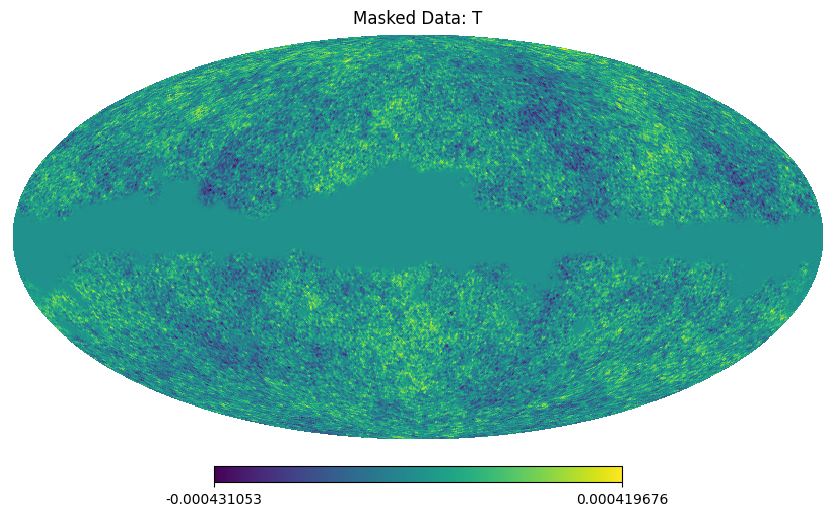

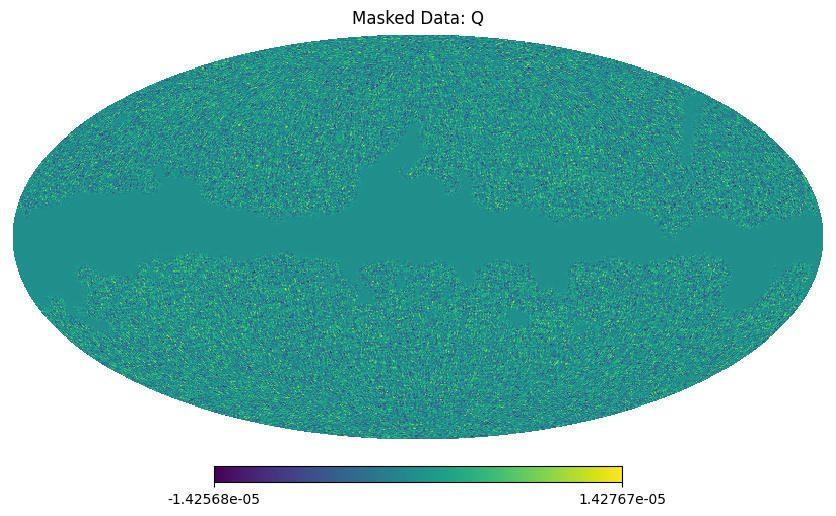

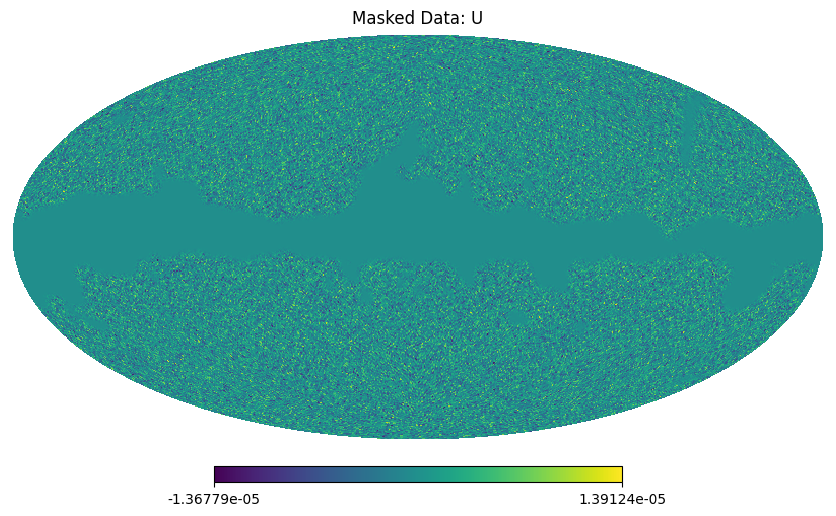

In [7]:
# Generate unmasked data with known C_l and (if desired) factorized b
# Cl^XY are set to the fiducial spectrum (which includes the beam) unless otherwise specified
raw_data = base.generate_data(seed=42, add_B=False)

# Mask the map
data = (raw_data*mask).reshape(len(raw_data),-1)

# Plot the data
labels = ['T','Q','U']
for i in range(len(data)):
    healpy.mollview(data[i],title='Masked Data: %s'%labels[i])

### Define weighting function
A crucial input to the unwindowed estimators is a function, $\mathsf{S}^{-1}$, which provides quasi-optimal weighting to the data. For an optimal estimator, $\mathsf{S}^{-1}=\mathsf{P}^\dagger\mathsf{C}^{-1}$, where $\mathsf{P}$ is the pointing matrix (including the beam and mask) and $\mathsf{C}^{-1}$ is the true pixel covariance (which includes noise and the beam). In the absence of a mask, the optimal $\mathsf{S}^{-1}$ is given by $C^{\mathrm{tot},-1}_\ell\times \mathsf{B}^{-1}$, where $C^{\rm tot}_{\ell}$ is the total (signal+noise+beam) power spectrum and $\mathsf{B}$ is the beam. In the presence of holes in the mask, the optimal weighting is non-trivial to implement, and we usually use an approximation (which does not lead to bias). 

In the ```polyspec.Weightings``` class, we implement two weighting schemes. 
- ```applySinv_ideal```: We (optionally) apply diffusive inpainting, then divide the data by $C^{\rm tot}_\ell/B_\ell$ in harmonic space.
- ```applySinv_optimal```: We implement the optimal weighting scheme using a conjugate gradient descent algorithm. This allows for spatially varying Poisson noise, but does not account for scale-dependence.
In practice, the idealized weighting is far cheaper and usually leads to close-to-optimal errors. Any other weighting scheme can be simply implemented by defining a new ```Sinv``` function, with the same structure as ```applySinv_ideal```.

In [8]:
# Define some mock pixel-space noise covariance
# This is only needed if we use the optimal S^-1 weighting
noise_cov = np.ones_like(data)*np.asarray([DeltaT**2, DeltaP**2, DeltaP**2])[:1+2*pol,None]/(4.*np.pi)*healpy.nside2npix(Nside)

# Define weighting class including theoretical Cl spectra
weightings = ps.Weightings(base, mask, Cl_th, noise_cov=noise_cov, inpainting_mask=None)

# Define ideal S^-1 operator
Sinv_ideal = weightings.applySinv_ideal

# Define optimal S^-1 operator, including conjugate-gradient-descent inversion
Sinv_opt = weightings.applySinv_optimal

check input descriptions e.g. for inpainting
## ADD WARNINGS ON BINARY / SMOOTH MASK?
# could have multiple input masks?


Let's compute and plot the weighted maps. We'll transform to pixel-space and add a factor of $C_\ell$, to obtain the Wiener-filtered solution.

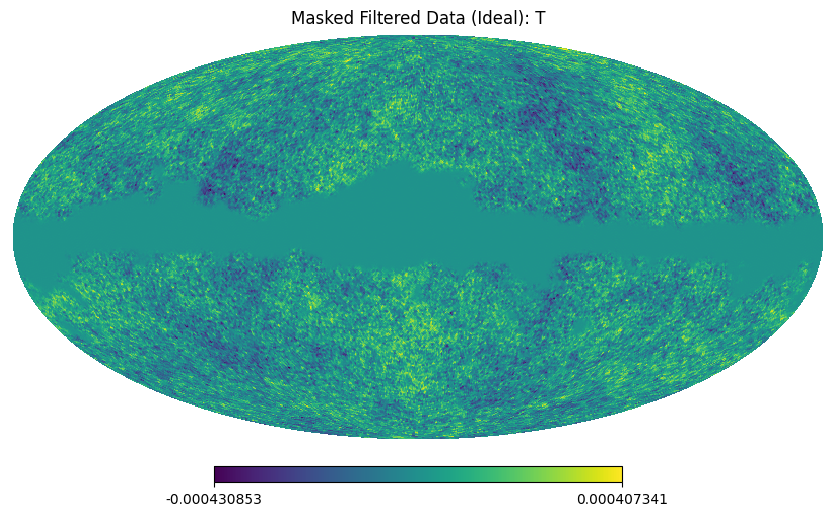

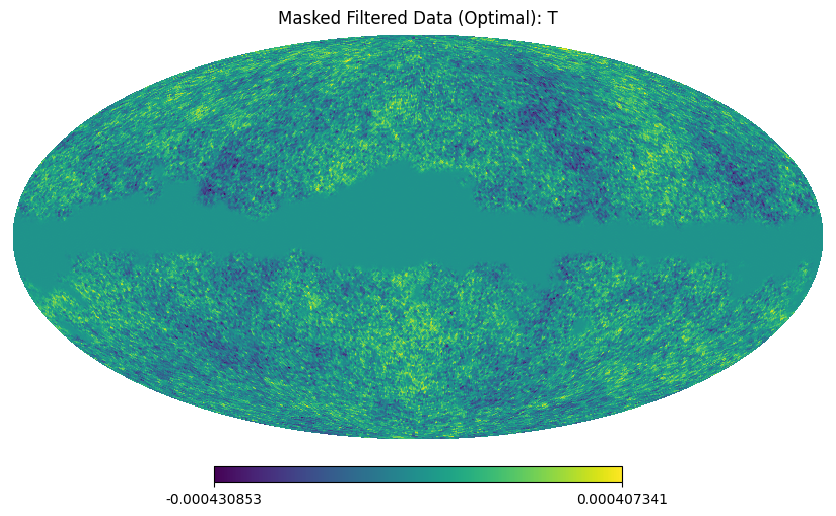

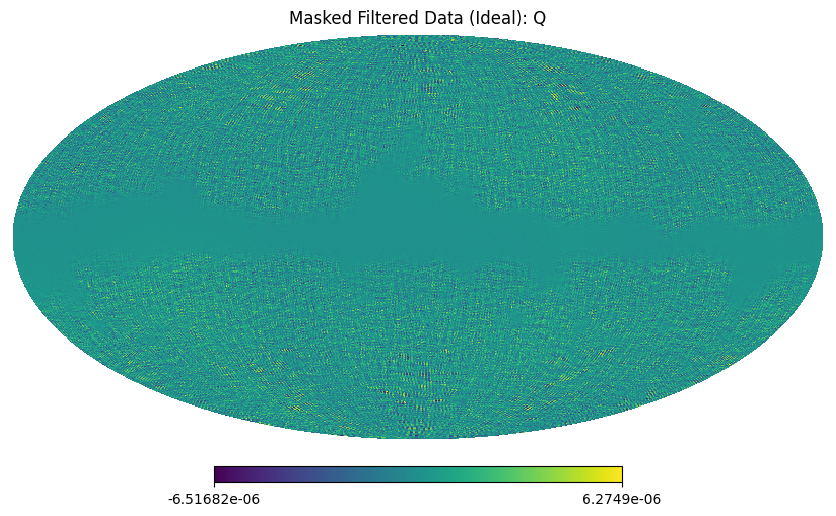

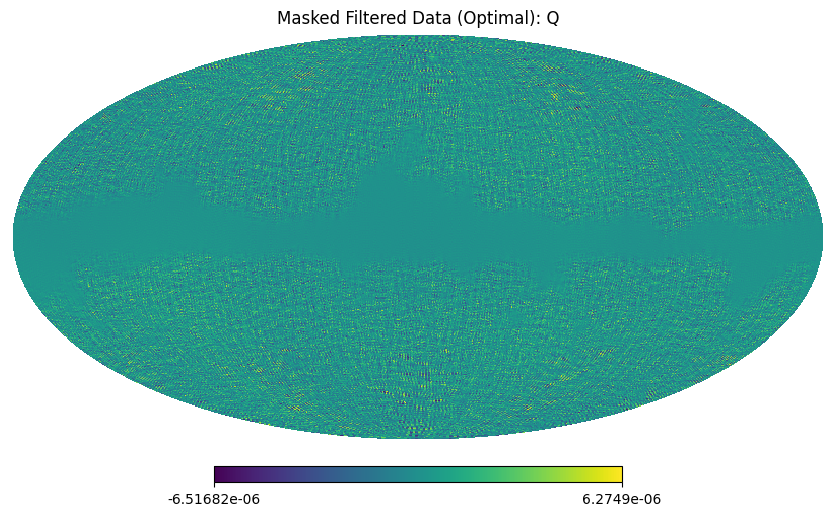

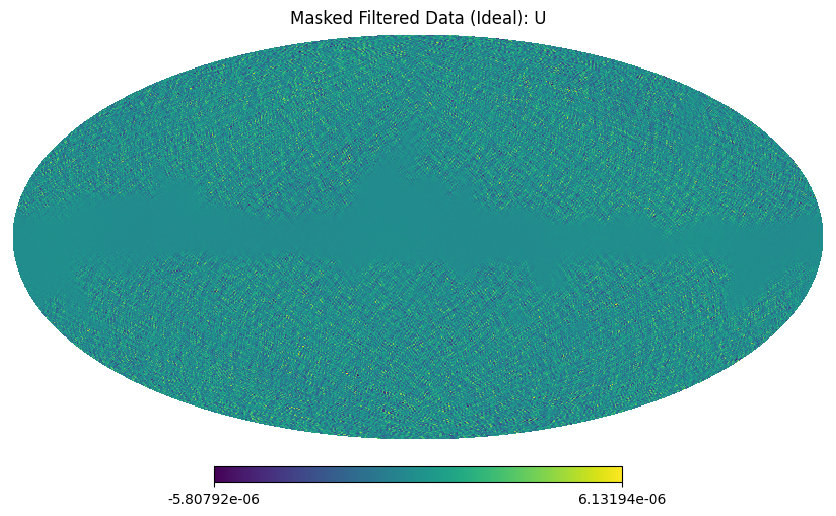

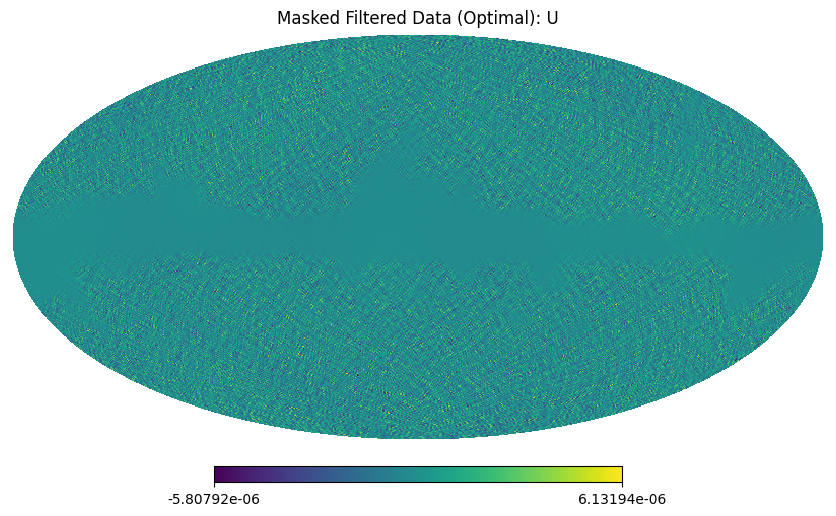

In [9]:
# Compute Wiener  the map
Sinv_data_ideal = base.to_map(np.einsum('lab,bl->al',weightings.Cl_lm_mat,Sinv_ideal(data)))
Sinv_data_opt = base.to_map(np.einsum('lab,bl->al',weightings.Cl_lm_mat,Sinv_ideal(data)))

# Plot the data
labels = ['T','Q','U']
for i in range(len(Sinv_data_ideal)):
    healpy.mollview(Sinv_data_ideal[i],title='Masked Filtered Data (Ideal): %s'%labels[i])
    healpy.mollview(Sinv_data_opt[i],title='Masked Filtered Data (Optimal): %s'%labels[i])

We're now ready to compute some statistics! 

# 2. Power Spectrum Estimation

Let's compute the binned power spectrum of the map, using both the idealized (i.e. pseudo-Cl) and window-free/optimal estimators. The second class of estimators require a normalization (Fisher) matrix which we can compute via multiprocessing. Note that this matrix is independent of the data, thus only needs to be computed once per mask / binning choice.

We need to specify which spectra we want to compute: these can be any of $[TT,TE,TB,EE,EB,BB]$. Note that the code will compute and correct for the covariance between each spectrum listed (and *only* these).

In [10]:
# Bin edges (could also be non-linearly spaced)
l_bins = np.arange(5,255,20)
Nl = len(l_bins)-1
print("binned lmax: %d, HEALPix lmax: %d"%(np.max(l_bins),lmax))
assert lmax>np.max(l_bins)

# Define fields to use
if pol:
    # For illustration, we'll use just the four parity-conserving spectra here
    fields=['TT','TE','EE','BB']
else:
    fields = ['TT']

# Initialize power spectrum class with the chosen S^-1 weighting
pspec = ps.PSpecBin(base, mask, Sinv_ideal, l_bins, fields=fields)

binned lmax: 245, HEALPix lmax: 383
## Caution: Maximum l is greater than HEALPix-lmax/2; this might cause boundary effects.
Binning: 12 bins in [5, 245]
Fields: ['TT', 'TE', 'EE', 'BB']
Mask: spatially varying


### Ideal Estimator

We'll begin by computing the (standard) idealized power spectrum estimator. This is straightforward to do, and involves only one harmonic transform (plus some $\ell$-space summations). The output is a dictionary, containing each power spectrum of interest. These spectra are closely related to the standard pseudo-Cl spectra, and are modulated by the mask.

In [11]:
# Compute idealized power spectrum
Cl_ideal = pspec.Cl_ideal(data)

# Compute the HEALPix unbinned pseudo-Cl power spectrum, for comparison
# Note that base.beam_lm includes the pixel window (if turned on)
data_lm = base.to_lm(data)
if pol:
    Cl_tmp = healpy.alm2cl([base.safe_divide(data_lm[i],base.beam_lm[i]) for i in range(3)])/np.mean(mask**2)
    Cl_raw_healpy = {}
    for field, healpy_index in zip(['TT','TE','TB','EE','EB','BB'],[0,3,5,1,4,2]):
        Cl_raw_healpy[field] = Cl_tmp[healpy_index] # reorder spectra
else:
    Cl_raw_healpy = {'TT':healpy.alm2cl(base.safe_divide(data_lm[0],base.beam_lm[0]))/np.mean(mask**2)}

Computing ideal Fisher matrix


In [12]:
# Define centers of l bins
ls = np.asarray(pspec.get_ells())

# Print out a few bin centers:
for i in range(min(len(ls),5)):
    print("Bin %d: l = %.1f"%(i,ls[i]))

Bin 0: l = 15.0
Bin 1: l = 35.0
Bin 2: l = 55.0
Bin 3: l = 75.0
Bin 4: l = 95.0


### Unwindowed Estimator

The unwindowed estimator computes a mask-deconvolved estimate of the binned power spectrum, (approximately) accounting for leakage between bins. To compute this, we'll first compute the Fisher normalization matrix, then use this to compute the full unwindowed estimator. Since we need to compute the Fisher matrix for all combinations of bins and fields, this can take a bit of time.

In [13]:
# Zero counters (for diagnostics only)
base.n_SHTs_forward, base.n_SHTs_reverse = 0, 0

# Compute Fisher matrix
fish = pspec.compute_fisher(N_it, verb=False);

# Compute unwindowed power spectrum
Cl_opt = pspec.Cl_unwindowed(data, fish=fish)

# Print some diagnostics
print("Computation complete using %d forward and %d reverse SHTs in total"%(base.n_SHTs_forward, base.n_SHTs_reverse))

Computing Fisher contribution 1 of 10
Computing Fisher contribution 2 of 10
Computing Fisher contribution 3 of 10
Computing Fisher contribution 4 of 10
Computing Fisher contribution 5 of 10
Computing Fisher contribution 6 of 10
Computing Fisher contribution 7 of 10
Computing Fisher contribution 8 of 10
Computing Fisher contribution 9 of 10
Computing Fisher contribution 10 of 10
Computation complete using 982 forward and 980 reverse SHTs in total


Alternatively, we can assemble the Fisher matrix by hand (e.g., if we wish to distribute between many nodes). Then we just need to pass it to the estimator.

In [14]:
# # Iterate by hand
# fish = 0.
# for i in range(N_it):
#     if i%5==0: print("On iteration %d of %d"%(i+1,N_it))
#     fish += pspec.compute_fisher_contribution(i, verb=(i==0))/N_it

# # Compute unwindowed power spectrum, passing the Fisher matrix
# Cl_opt = pspec.Cl_unwindowed(data, fish=fish)

### Plots

Let's plot the results! We note that the final bin or two of the optimal estimator could be biased since we ignore the correlations with the higher bins. These would be excluded in any real analysis.

We also plot the Fisher matrix, which shows how correlated individual bins and fields are as a result of the window (and the intrinsic correlations between fields). The idealized Fisher matrix is diagonal since we ignore leakage between bins.

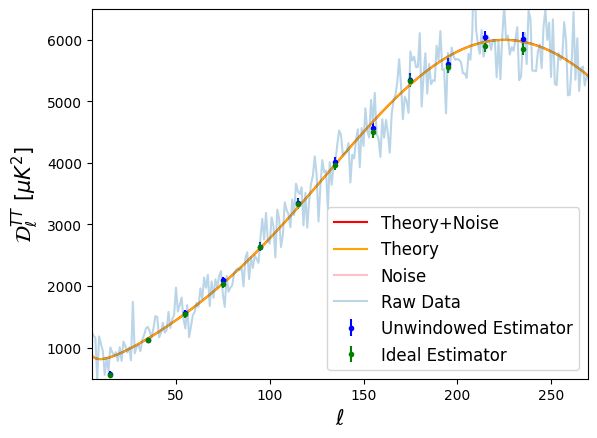

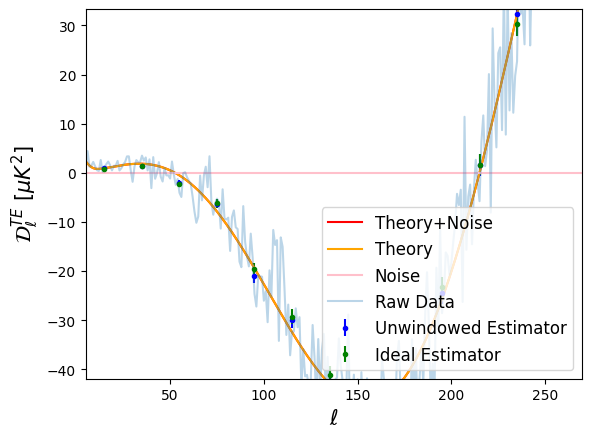

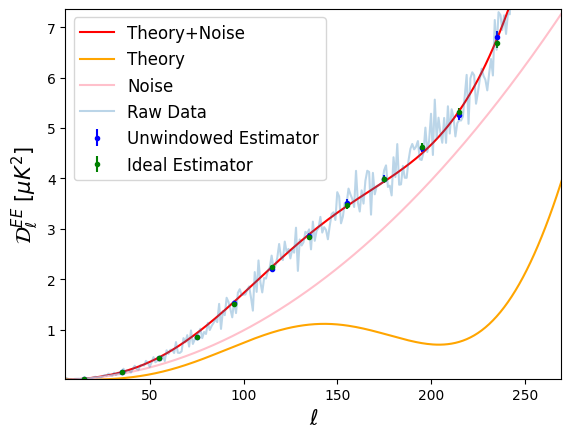

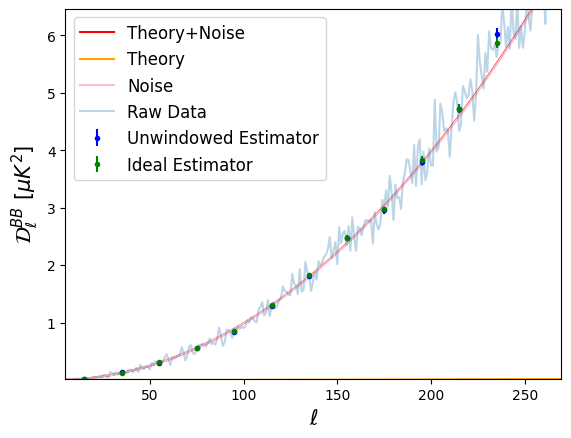

In [15]:
l_av = 0.5*(l_bins[1:]+l_bins[:-1])
pref_av = l_av*(l_av+1.)/(2.*np.pi)*1e12
pref = l*(l+1)/(2.*np.pi)*1e12

for i,field in enumerate(pspec.fields):
    
    # Fisher error
    fish_err = np.sqrt(np.diag(pspec.inv_fish)[i*pspec.Nl:(i+1)*pspec.Nl])
    fish_err_ideal = np.sqrt(np.diag(pspec.inv_fish_ideal)[i*pspec.Nl:(i+1)*pspec.Nl])*np.sqrt(np.mean(mask**4.)/np.mean(mask**2)**2)
    
    # Plot spectra
    plt.figure()
    plt.errorbar(l_av,pref_av*Cl_opt[field],yerr=pref_av*fish_err,marker='.',ls='',label='Unwindowed Estimator',c='b')
    plt.errorbar(l_av,pref_av*Cl_ideal[field],yerr=pref_av*fish_err_ideal,marker='.',ls='',label='Ideal Estimator',c='g')
    plt.plot(l,pref*(Cl_th[field]+Nl_th[field]/(1e-12+beam[0]**2)),label='Theory+Noise',c='r')
    plt.plot(l,pref*Cl_th[field],label='Theory',c='orange')
    plt.plot(l,pref*(Nl_th[field]/(1e-12+beam[0]**2)),label='Noise',c='pink')
    plt.plot(l,pref*Cl_raw_healpy[field],label='Raw Data',alpha=0.3)
    plt.xlim([min(l_bins),max(l_bins)*1.1])
    plt.xlabel(r'$\ell$',fontsize=15)
    plt.ylabel(r'$\mathcal{D}^{%s}_\ell\,\,[\mu K^2]$'%pspec.fields[i],fontsize=15)
    plt.legend(fontsize=12)
    plt.ylim([min(0.9*pref_av*Cl_ideal[field]),max(1.1*pref_av*Cl_ideal[field])])

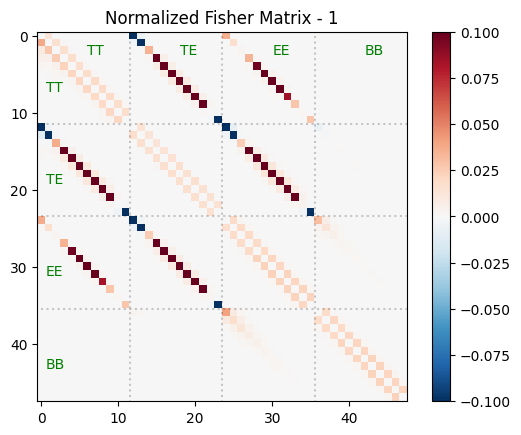

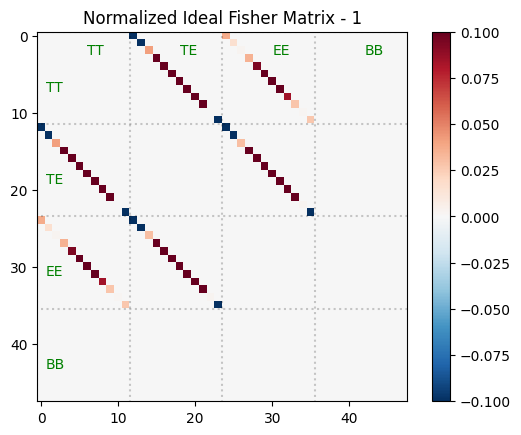

In [16]:
# Plot Fisher matrices (real and ideal)

def plot_correlation(matrix,v=0.1,title=''):
    # Define correlation
    corr_matrix = matrix/np.sqrt(np.outer(np.diag(matrix),np.diag(matrix)))

    # Plot matrix
    plt.figure()
    plt.imshow(corr_matrix-np.eye(len(corr_matrix)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    plt.title(title)
    plt.colorbar();
    
    for i in range(len(pspec.fields)):
        plt.hlines(i*pspec.Nl-0.5,0,len(pspec.fields)*pspec.Nl,linestyles=':',color='k',alpha=0.2)
        plt.vlines(i*pspec.Nl-0.5,0,len(pspec.fields)*pspec.Nl,linestyles=':',color='k',alpha=0.2)
    for i in range(len(pspec.fields)):
        plt.text((i+0.5)*pspec.Nl,pspec.Nl*0.2,pspec.fields[i],c='g')
        plt.text(pspec.Nl*0.05,(i+0.6)*pspec.Nl,pspec.fields[i],c='g')
    plt.xlim(-0.5,len(matrix)-0.5)
    plt.ylim(len(matrix)-0.5,-0.5)

plot_correlation(pspec.fish,title="Normalized Fisher Matrix - 1")
plot_correlation(pspec.fish_ideal,title="Normalized Ideal Fisher Matrix - 1")

### Validation
We can test whether the estimator is (close-to) minimum variance by iterating over GRF datasets. This is fast, since we don't need to recompute the Fisher matrix!

In [17]:
Cl_unwindowed_all, Cl_ideal_all, Cl_raw_all = [{f:[] for f in pspec.fields} for _ in range(3)]

for ii in range(N_sim):
    if ii%10==0: 
        print("Analyzing simulation %d of %d"%(ii+1,N_sim))
    
    # Generate data (pure GRFs here)
    raw_sim = base.generate_data(ii,add_B=False)
    sim = (raw_sim*mask).reshape(len(raw_data),-1)

    # Compute binned and unbinned power spectra
    this_unwindowed = pspec.Cl_unwindowed(sim)
    this_ideal = pspec.Cl_ideal(sim)
    
    # Add to dictionaries
    for f in pspec.fields:
        Cl_unwindowed_all[f].append(this_unwindowed[f])
        Cl_ideal_all[f].append(this_ideal[f])
    
    # Compute HEALPix power spectra
    raw_sim_lm = base.to_lm(raw_sim)
    if pol:
        Cl_tmp = healpy.alm2cl([base.safe_divide(raw_sim_lm[i],base.beam_lm[i]) for i in range(3)])
        for field, healpy_index in zip(['TT','TE','EE','BB'],[0,3,1,2]):
            Cl_raw_all[field].append(Cl_tmp[healpy_index]) # reorder spectra
    else:
        Cl_raw_all['TT'].append(healpy.alm2cl(base.safe_divide(raw_sim_lm[0],base.beam_lm[0])))

Analyzing simulation 1 of 50
Analyzing simulation 11 of 50
Analyzing simulation 21 of 50
Analyzing simulation 31 of 50
Analyzing simulation 41 of 50


Below, we plot the results. Importantly, the variance of the unwindowed estimator matches its Fisher matrix - i.e. it is roughly optimal! (Note that perfect optimality is only guaranteed if we use optimal weights).

However, it looks like the idealized estimator has a slightly *lower* variance? This is due to the off-diagonal correlations imposed by the window function, as seen in the correlation matrices.

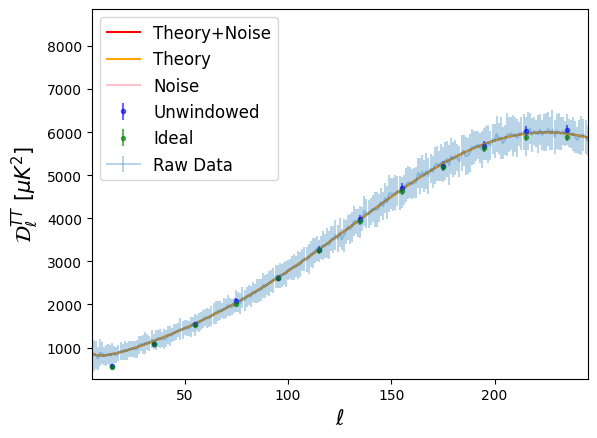

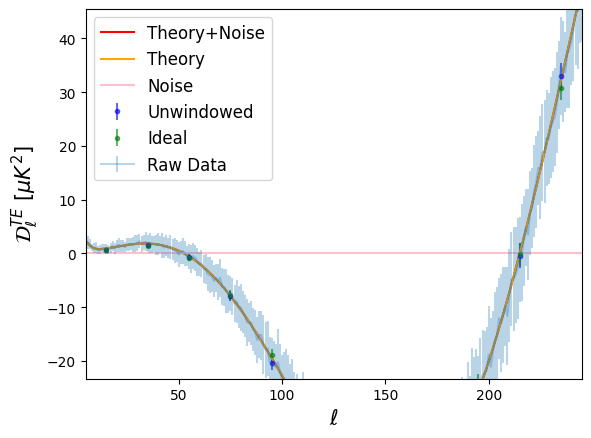

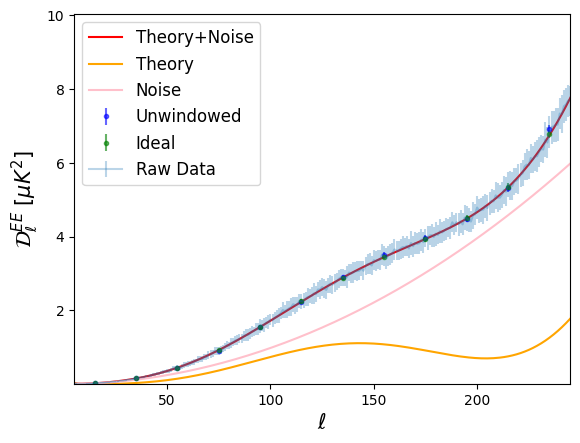

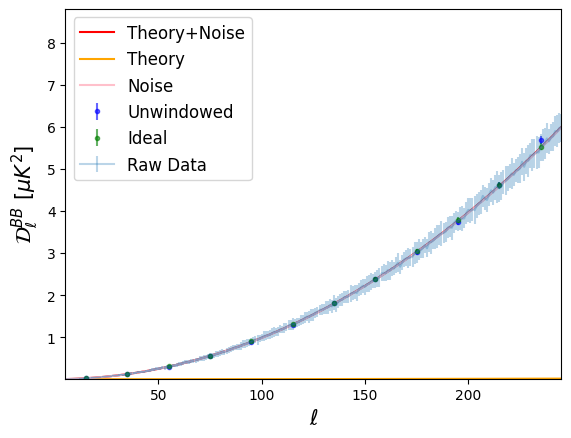

In [18]:
for i,field in enumerate(pspec.fields):
    
    # Fisher error
    fish_err = np.sqrt(np.diag(pspec.inv_fish)[i*pspec.Nl:(i+1)*pspec.Nl])
    fish_err_ideal = np.sqrt(np.diag(pspec.inv_fish_ideal)[i*pspec.Nl:(i+1)*pspec.Nl])*np.sqrt(np.mean(mask**4.)/np.mean(mask**2)**2)
    
    # Plot spectra
    plt.figure()
    plt.errorbar(l_av,pref_av*np.asarray(Cl_unwindowed_all[field]).mean(axis=0),yerr=pref_av*fish_err,marker='.',ls='',label='Unwindowed',c='b',alpha=0.6)
    plt.errorbar(l_av,pref_av*np.asarray(Cl_ideal_all[field]).mean(axis=0),yerr=pref_av*fish_err_ideal,marker='.',ls='',label='Ideal',c='g',alpha=0.6)
    plt.plot(l,pref*(Cl_th[field]+Nl_th[field]/(1e-12+beam[0]**2)),label='Theory+Noise',c='r')
    plt.plot(l,pref*Cl_th[field],label='Theory',c='orange')
    plt.plot(l,pref*Nl_th[field]/(1e-12+beam[0]**2),label='Noise',c='pink')
    plt.errorbar(l,pref*np.mean(Cl_raw_all[field],axis=0),yerr=pref*np.std(Cl_raw_all[field],axis=0),label='Raw Data',alpha=0.3)
    plt.xlim([min(l_bins),max(l_bins)])
    plt.xlabel(r'$\ell$',fontsize=15)
    plt.ylabel(r'$\mathcal{D}^{%s}_\ell\,\,[\mu K^2]$'%field,fontsize=15)
    plt.legend(fontsize=12)
    plt.ylim([0.5*min(pref_av*Cl_ideal[field]),1.5*max(pref_av*Cl_ideal[field])])

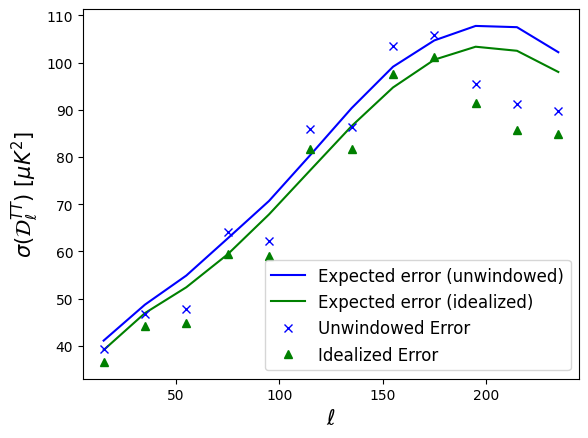

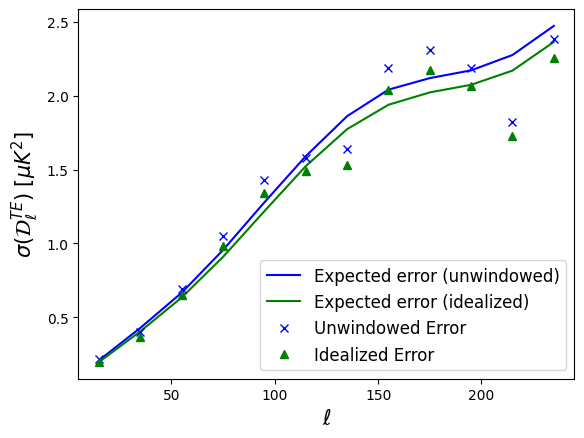

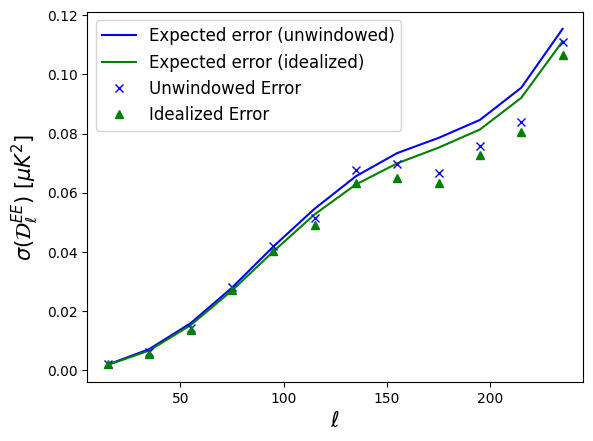

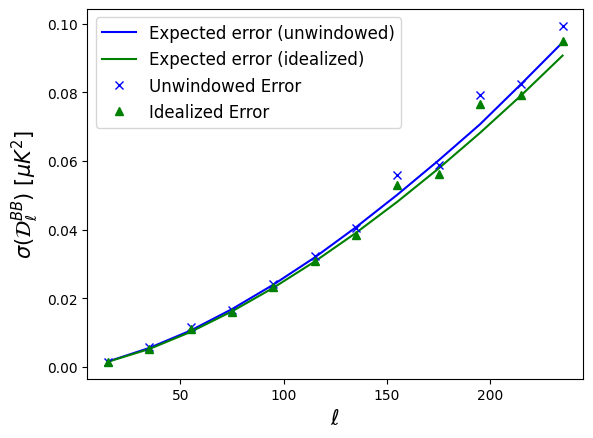

In [19]:
for i,field in enumerate(pspec.fields):
    
    # Fisher error
    fish_err = np.sqrt(np.diag(pspec.inv_fish)[i*pspec.Nl:(i+1)*pspec.Nl])
    fish_err_ideal = np.sqrt(np.diag(pspec.inv_fish_ideal)[i*pspec.Nl:(i+1)*pspec.Nl])*np.sqrt(np.mean(mask**4.)/np.mean(mask**2)**2)
    
    # Plot spectra
    plt.figure()
    plt.plot(l_av,pref_av*fish_err,label='Expected error (unwindowed)',c='b')
    plt.plot(l_av,pref_av*fish_err_ideal,label='Expected error (idealized)',c='g')
    plt.plot(l_av,pref_av*np.std(Cl_unwindowed_all[field],axis=0),label='Unwindowed Error',c='b',marker='x',ls='')
    plt.plot(l_av,pref_av*np.std(Cl_ideal_all[field],axis=0),label='Idealized Error',c='g',marker='^',ls='')
    plt.xlim([min(l_bins),max(l_bins)])
    plt.xlabel(r'$\ell$',fontsize=15)
    plt.ylabel(r'$\sigma(\mathcal{D}^{%s}_\ell)\,\,[\mu K^2]$'%field,fontsize=15)
    plt.legend(fontsize=12)

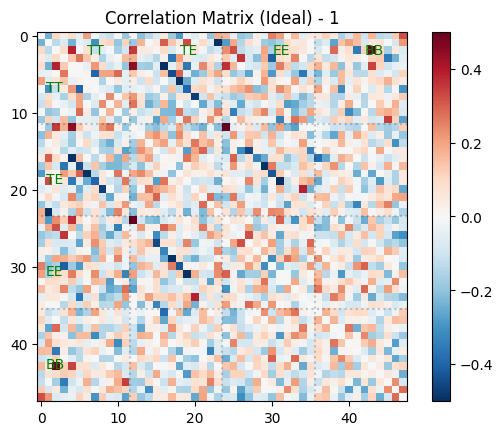

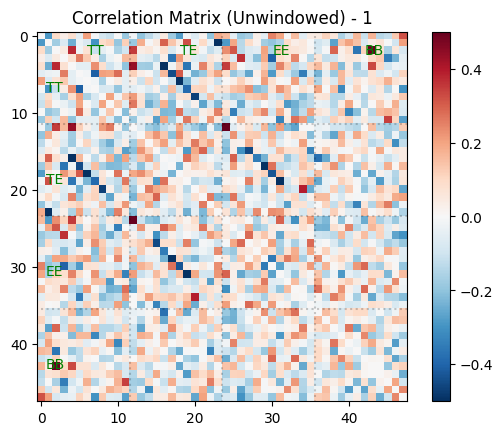

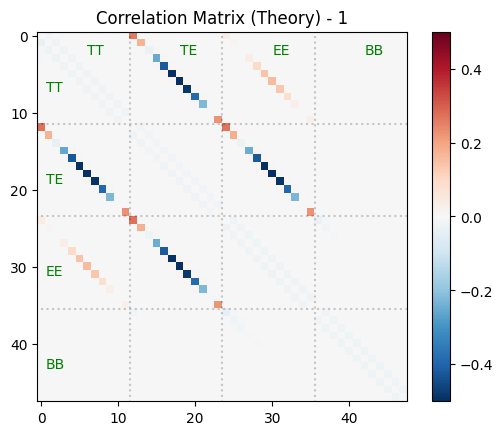

In [20]:
# Plot Fisher matrices (real and ideal)

cov_ideal = np.cov(np.hstack([Cl_ideal_all[f] for f in pspec.fields]).T)
cov_unwindowed = np.cov(np.hstack([Cl_unwindowed_all[f] for f in pspec.fields]).T)
cov_theory = np.linalg.inv(pspec.fish)
    
plot_correlation(cov_ideal,title="Correlation Matrix (Ideal) - 1",v=0.5)
plot_correlation(cov_unwindowed,title="Correlation Matrix (Unwindowed) - 1",v=0.5)
plot_correlation(cov_theory,title="Correlation Matrix (Theory) - 1",v=0.5)

# 3. Bispectrum Estimation

We now move to estimating the bispectrum, both via idealized and window-free estimators. As before, we will need to compute a Fisher matrix, depending on the survey geometry. To avoid the dimensionality (and run-time) getting out of hand, we will use a broad binning for this exercise, noting that bispectra are much more computationally expensive than power spectra! In practice, one would usually run the Fisher matrix on a cluster rather than on a laptop.

As for the power spectrum, we need to specify which spectra we want to compute: these can be any subset of $[TTT,TTE,TEE,EEE,TBB,EBB,TTB,TEB,EEB,BBB]$. Note that the code will compute and correct for the covariance between each spectrum listed (and *only* these). Here, we also need to specify which *parities* to compute, since the bispectrum is sensitive to parity-conserving and parity-breaking physics. Here, we'll consider both by default, though only parity-even is needed for scalar fields. We note that parity-odd $TTT$, $TTE$, $TEE$, $EEE$ can be measured by the code, but (at least at linear order) are not physical.

In [21]:
## Binning parameters
# Note that we can use separate binning for squeezed triangles
l_bins = np.arange(5,35,10)
l_bins_squeeze = np.arange(5,45,10)

In [22]:
# Initialize bispectrum class, using chosen S^-1 scheme
if pol:
    # For testing, we'll restrict to just parity-even T+E-mode bispectra (remembering that parity-odd T+E bispectra are unphysical!)
    bspec = ps.BSpecBin(base, mask, Sinv_ideal, l_bins, l_bins_squeeze=l_bins_squeeze, include_partial_triangles=include_partial_triangles,
                     fields=['TTT', 'TTE','TEE','EEE'], parity='even')
else:
    bspec = ps.BSpecBin(base, mask, Sinv_ideal, l_bins,l_bins_squeeze=l_bins_squeeze, include_partial_triangles=include_partial_triangles,
                     fields=['TTT'], parity='even')

Binning: 2 bins in [5, 25]
Squeezed binning: 3 bins in [5, 35]
Mask: spatially varying


In [23]:
# Compute centers of l1, l2, l3 bins for the temperature spectrum
# these can differ between spectra due to restrictions on bin1 <= bin2 etc.
l1s,l2s,l3s = np.asarray(bspec.get_ells('TTT'))

# Print out a few bin centers:
for i in range(min(len(l1s),5)):
    print("Bin %d: l1 = %.1f, l2 = %.1f, l3 = %.1f"%(i,l1s[i],l2s[i],l3s[i]))

Bin 0: l1 = 10.0, l2 = 10.0, l3 = 10.0
Bin 1: l1 = 10.0, l2 = 10.0, l3 = 20.0
Bin 2: l1 = 10.0, l2 = 20.0, l3 = 20.0
Bin 3: l1 = 10.0, l2 = 20.0, l3 = 30.0
Bin 4: l1 = 10.0, l2 = 30.0, l3 = 30.0


### Ideal Estimator

Let's start by computing the ideal bispectrum. This is a fair amount more expensive than before, requiring $\mathcal{O}(3N_{\rm bin})$ harmonic transforms. The `Bl_ideal` function computes the normalization internally via an $\mathcal{O}(\ell_{\rm max}^3)$ sum over Wigner matrices involving $\ell_1,\ell_2,\ell_3$, which can be expensive for large $\ell_{\rm max}$. Due to this complexity, we usually recommend using the unwindowed routine instead (which computes the normalization via Monte Carlo methods).

For testing, we'll add a $T$-mode primordial bispectrum to the data (fixing to even $\ell_1+\ell_2+\ell_3$ here). 

The output is a dictionary containing each spectrum of interest, named '$XYZ\pm$' where $\chi=\pm$ indicates the parity. Note that we take the imaginary part of spectra with odd $\chi\,p_{XYZ}$ (e.g., $TTB+$, $TTT-$, etc.)

In [24]:
# Define separable reduced bispectrum 
# note this is for T, E, B if polarized - here we just use a T-mode spectrum
# we will also restrict l1+l2+l3 to be even below, though this is not required
if pol:
    # Compute E and B mode rescaling
    E_ratio = (Cl_fiducial['EE'][40]/Cl_fiducial['TT'][40])**(1./2.)
    B_ratio = (Cl_fiducial['BB'][40]/Cl_fiducial['TT'][40])**(1./2.)
    b_input_fac = lambda l1: np.asarray([1.,0.*E_ratio, 0.*B_ratio]).reshape(-1,1)*np.exp(-(l1-2)/40.)*2e-6
else:
    b_input_fac = lambda l1: [np.exp(-(l1-2)/40.)*2e-6]

# Compute data
print("## Generating data")
data = mask*base.generate_data(seed=42, add_B=True, b_input=b_input_fac, sum_ells='even')

# Compute ideal bispectra
print("\n## Computing ideal bispectrum")
b_ideal = bspec.Bl_ideal(data, verb=True, N_cpus=N_cpus)

## Generating data
Computing offset for synthetic maps

## Computing ideal bispectrum
Computing ideal Fisher matrix
Using a total of 46 bins
Multiprocessing computation on 4 cores


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 56.40it/s]


Fisher matrix computation complete

Computing H maps
Analyzing bispectrum numerator


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 852.31it/s]


### Window-free estimator
The window-free bispectrum can be computed similarly to the window-free power spectrum, and similarly involves a (non-diagonal) Fisher matrix. Since there are a large number of bin combinations and fields considered, the Fisher matrix might take a bit of time to compute.

Within the bispectrum numerator, we can optionally subtract off the "linear" term (i.e. use $\widehat{B} \sim d^3 - 3\langle{d^2}d$ instead of $\widehat{B} \sim d^3$), using a set of simulations. These can be generated by the code (as GRFs, optionally with an added factorizable bispectrum), or we could load an external set (e.g., FFP10 simulations). These should have the same covariance as the data (but do not need to have accurate higher-order statistics). Here we'll generate the sims in harmonic space, to avoid unnecessary spherical harmonic transforms. 

In this example, we load all simulations into memory (using a small number for testing), then compute the bispectra. If memory usage is a concern, one can set ```preload=False```, which loads one simulation at a time when needed. The simulation harmonic transforms are not saved in this mode, so must be recomputed for each new dataset analyzed.

In [25]:
# Generate MC simulations for estimator numerator
# No need for bispectrum contributions here!
bspec.generate_sims(N_it,add_B=False, preload=True, verb=True)

# # Alternatively, read-in MC simulations created externally
# def load_sim(ii):
#     """This function loads and returns a single simulation"""
#     return mask*base.generate_data(seed=int(1e5)+ii,add_B=False,output_type='map')
# bspec.load_sims(load_sim, N_it, verb=True, preload=False, input_type='map')

Using 10 Monte Carlo simulations
Generating bias simulation 1 of 10
Generating bias simulation 2 of 10
Generating bias simulation 3 of 10
Generating bias simulation 4 of 10
Generating bias simulation 5 of 10
Generating bias simulation 6 of 10
Generating bias simulation 7 of 10
Generating bias simulation 8 of 10
Generating bias simulation 9 of 10
Generating bias simulation 10 of 10


In [26]:
# Zero counters (for diagnostics only)
base.n_SHTs_forward, base.n_SHTs_reverse = 0, 0

# Compute the Fisher matrix, via multiprocessing
fish = bspec.compute_fisher(N_it, verb=True)

# Compute the unwindowed estimator, optionally including the linear term
b_unwindowed = bspec.Bl_unwindowed(data, verb=True, include_linear_term=True)

# Print some diagnostics
print("Computation complete using %d forward and %d reverse SHTs per iteration"%(base.n_SHTs_forward//N_it, base.n_SHTs_reverse//N_it))

Computing Fisher contribution 1 of 10
# Generating GRFs

# Computing Q3 map for S^-1 weighting
Creating H maps
Allocating 0.15 GB of memory
Creating H maps
Allocating 0.15 GB of memory

# Computing Q3 map for A^-1 weighting
Creating H maps
Allocating 0.15 GB of memory
Applying S^-1 weighting to output
Creating H maps
Allocating 0.15 GB of memory
Applying S^-1 weighting to output

# Assembling Fisher matrix

Computing Fisher contribution 2 of 10
Computing Fisher contribution 3 of 10
Computing Fisher contribution 4 of 10
Computing Fisher contribution 5 of 10
Computing Fisher contribution 6 of 10
Computing Fisher contribution 7 of 10
Computing Fisher contribution 8 of 10
Computing Fisher contribution 9 of 10
Computing Fisher contribution 10 of 10
Computing H maps


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 304.55it/s]


Computing b_1 piece from simulation 5


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 349.31it/s]

Computing b_1 piece from simulation 10



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 357.95it/s]


Computation complete using 416 forward and 261 reverse SHTs per iteration


As before, we can compute the Fisher matrix externally (e.g., on a cluster) and read it in.

In [27]:
# # Iterate by hand
# fish = 0.
# for i in range(N_it):
#     if i%5==0: print("On iteration %d of %d"%(i+1,N_it))
#     fish += bspec.compute_fisher_contribution(i, verb=(i==0))/N_it

# # Compute unwindowed estimator, passing the Fisher matrix
# b_unwindowed = bspec.Bl_unwindowed(data, verb=True, fish=fish, include_linear_term=True)

### Plots

Now let's plot the results!

Bispectra are harder to plot than power spectra, due to their higher dimensionality. Here, we'll just stack all the data into one dimension for each choice of fields and parity index, reading off the spectra from the output dictionaries produced by PolySpec. This starts with $b_1=b_2=b_3=1$, then updates each bin in turn, starting with $b_3$ and selecting only bins satisfying the triangle condition.

Below, we'll compare the results from the two estimators as well as the theory model for each component.

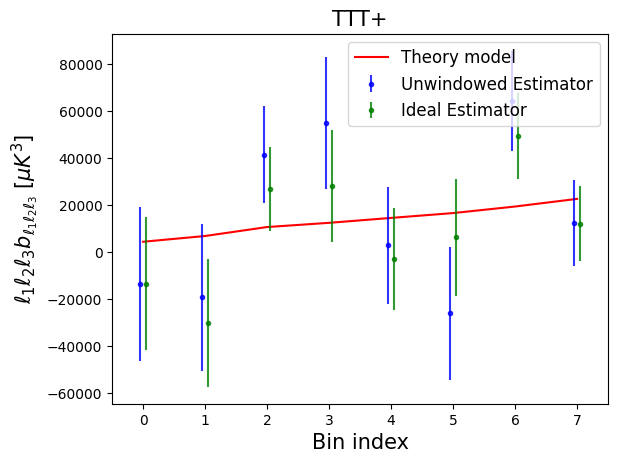

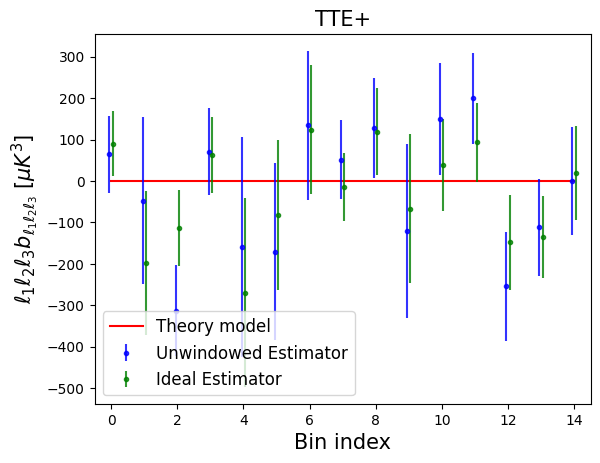

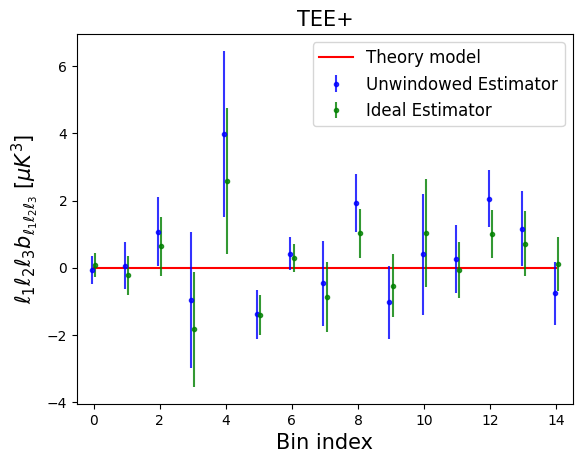

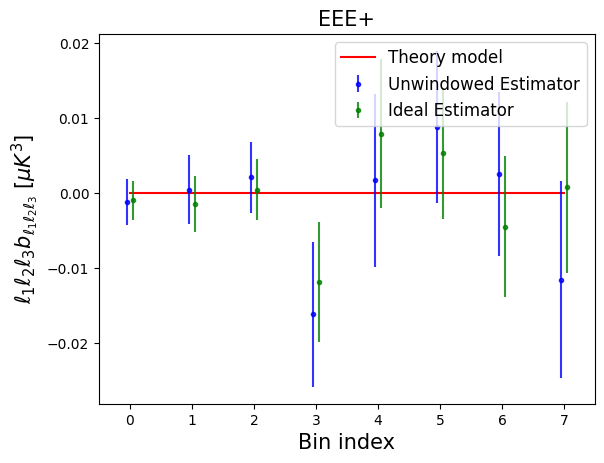

In [28]:
index = 0
for i,f in enumerate(b_ideal.keys()):
    
    ells_sum = np.product([base.parities[ff] for ff in f[:-1]])*int('%s'%f[-1]+'1')
    
    # Define weights and model
    l1s,l2s,l3s = np.asarray(bspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*1e18
    bl_model = np.product([b_input_fac([l1s,l2s,l3s][i])[base.indices[f[i]]] for i in range(3)],axis=0)
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(bspec.inv_fish)[index:index+len(weights)])
    fish_err_ideal = np.sqrt(np.diag(bspec.inv_fish_ideal)[index:index+len(weights)])*np.sqrt(np.mean(mask**6.)/np.mean(mask**3)**2)
    index += len(weights)

    plt.figure()
    x_arr = np.arange(len(weights))
    if ells_sum==1:
        plt.plot(x_arr,weights*bl_model,label='Theory model',c='r')
    else:
        plt.plot(x_arr,0*weights*bl_model,label='Theory model',c='r')
    plt.errorbar(x_arr-0.05,weights*b_unwindowed[f],yerr=weights*fish_err,marker='.',ls='',label='Unwindowed Estimator',c='b',alpha=0.8)
    plt.errorbar(x_arr+0.05,weights*b_ideal[f],yerr=weights*fish_err_ideal,ls='',marker='.',label='Ideal Estimator',alpha=0.8,c='g')
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\ell_1\ell_2\ell_3b_{\ell_1\ell_2\ell_3}\,\,[\mu K^3]$',fontsize=15)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)

We'll also consider the Fisher matrix (both true and ideal). Notably, we can see non-trivial off-diagonal correlations imparted by the survey geometry and by correlations between different fields. The spectra is usually close to block-diagonal: in the ideal limit, there are no correlations between bispectra with different numbers of $B$ modes (since $C_\ell^{EB}=C_\ell^{TB}=0$ usually), and none between parity-even and parity-odd physics.

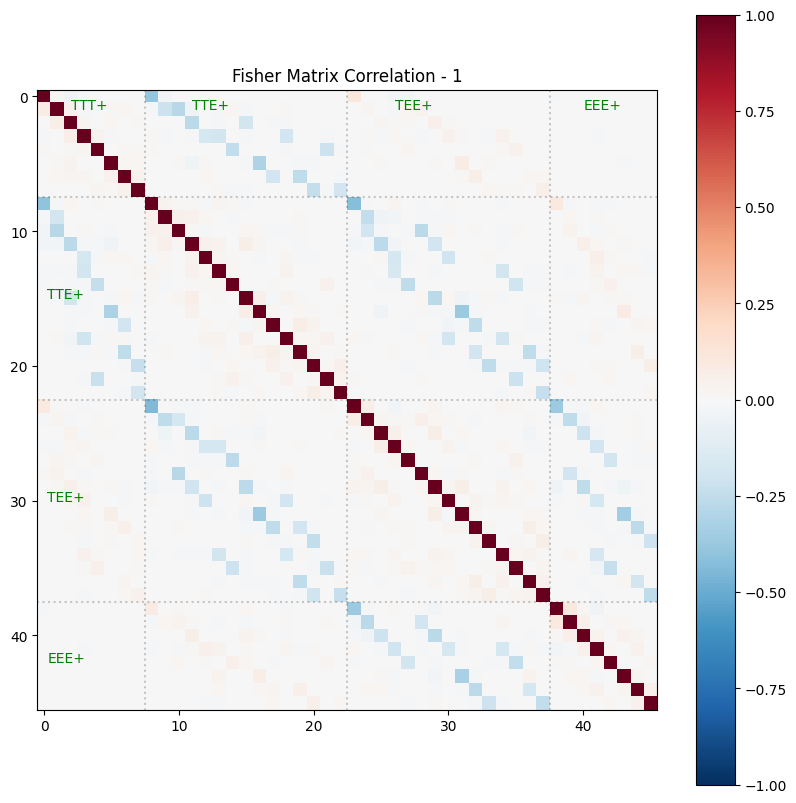

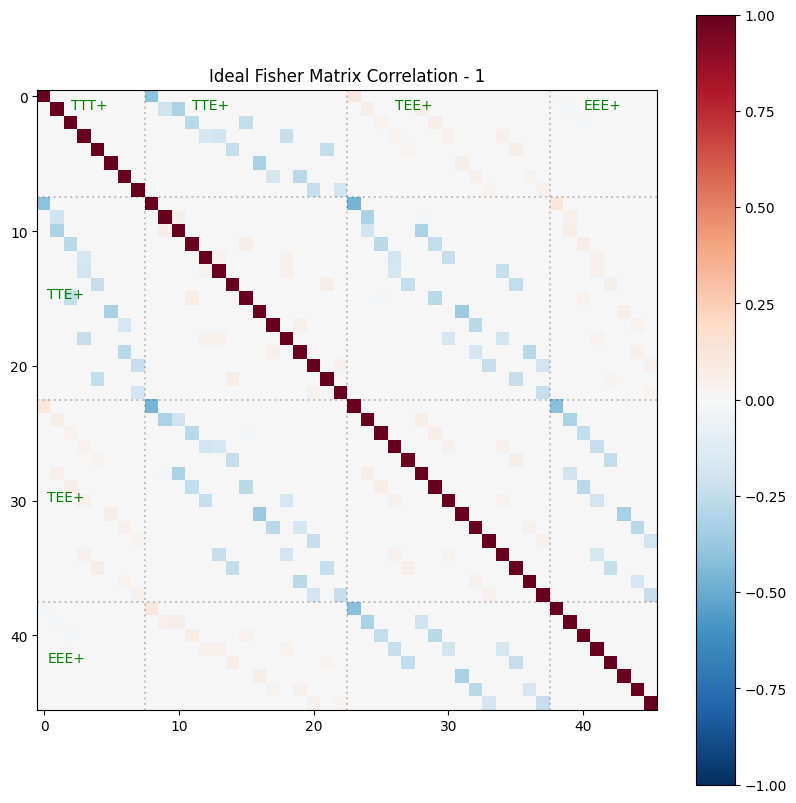

In [29]:
def plot_bis_correlation(matrix,v=0.5,title='',remove_diagonal=True):
    # Define correlation
    corr_matrix = matrix/np.sqrt(np.outer(np.diag(matrix),np.diag(matrix)))

    # Plot matrix
    plt.figure(figsize=(10,10))
    plt.imshow(corr_matrix-remove_diagonal*np.eye(len(corr_matrix)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    plt.title(title)
    plt.colorbar();
    
    i1 = 0
    for i,k in enumerate(b_ideal.keys()):
        plt.hlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.2)
        plt.vlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.2)
        i1 += len(b_ideal[k])
    i1 = 0.
    for i,k in enumerate(b_ideal.keys()):
        plt.text(i1+len(b_ideal[k])//4,len(matrix)*0.02,list(b_ideal.keys())[i],c='g')
        i1 += len(b_ideal[k])
    i1 = 0.
    for i,k in enumerate(b_ideal.keys()):
        if i>0: plt.text(len(matrix)*0.005,i1+len(b_ideal[k])//2,list(b_ideal.keys())[i],c='g')
        i1 += len(b_ideal[k])
    plt.xlim(-0.5,len(matrix)-0.5)
    plt.ylim(len(matrix)-0.5,-0.5)

plot_bis_correlation(bspec.fish, v=1, title='Fisher Matrix Correlation - 1', remove_diagonal=False)
plot_bis_correlation(bspec.fish_ideal, v=1, title='Ideal Fisher Matrix Correlation - 1', remove_diagonal=False)

### Validation

To test the estimators, we can compute the variance from a suite of mock datasets, as for the power spectrum. This is comparatively cheap, since we have already loaded the Monte Carlo simulations (for the linear term) and the Fisher matrix.

In [30]:
# Set counters to zero
base.n_SHTs_forward, base.n_SHTs_reverse = 0, 0

# Define arrays
b_unwindowed_all = {f:[] for f in b_ideal.keys()}
b_ideal_all = {f:[] for f in b_ideal.keys()}

for jj in range(N_sim):
    
    if jj%10==0: 
        print("Analyzing simulation %d of %d"%(jj+1,N_sim))

    # Generate masked data
    data = mask*base.generate_data(jj,add_B=True, b_input=b_input_fac, remove_mean=True, sum_ells='even')
    
    # Analyze sim
    this_Bl_ideal = bspec.Bl_ideal(data, verb=False)
    this_Bl_unwindowed = bspec.Bl_unwindowed(data, verb=False)
    
    # Add to arrays
    for f in b_ideal.keys():
        b_ideal_all[f].append(this_Bl_ideal[f])
        b_unwindowed_all[f].append(this_Bl_unwindowed[f])
    
# Print some diagnostics
print("Computation complete using %d forward and %d reverse SHTs per simulation"%(base.n_SHTs_forward//N_sim, base.n_SHTs_reverse//N_sim))

Analyzing simulation 1 of 50
Analyzing simulation 11 of 50
Analyzing simulation 21 of 50
Analyzing simulation 31 of 50
Analyzing simulation 41 of 50
Computation complete using 6 forward and 40 reverse SHTs per simulation


Below, we plot the results and, below, their errorbars. Once again, the variance is very close to the Fisher matrix prediction, i.e. we are close to optimal! 

Due to the non-zero fiducial bispectrum we injected into the data, there is some inflation in the recovered error-bars relative to the (Gaussian) Fisher matrix prediction. Furthermore, if too few simulations are used in the 1-field term, this will lead to an increase in the unwindowed estimator variance. If we try and compute parity-odd bispectra, we may find that some bins have very large variances: this happens if we are trying to compute the bispectrum of odd $\ell_1+\ell_2+\ell_3$ but the bin contains only triplets with even $\ell_1+\ell_2+\ell_3$!

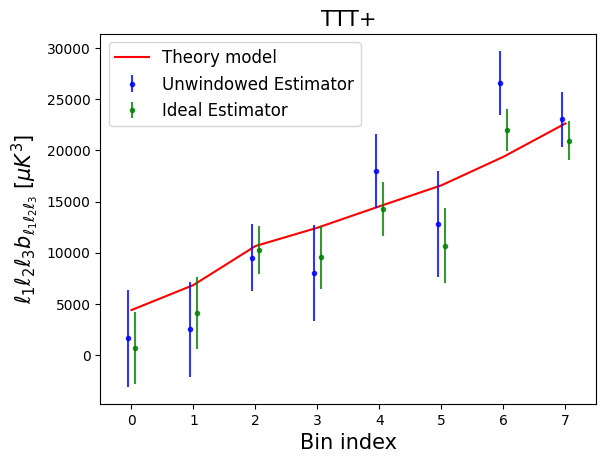

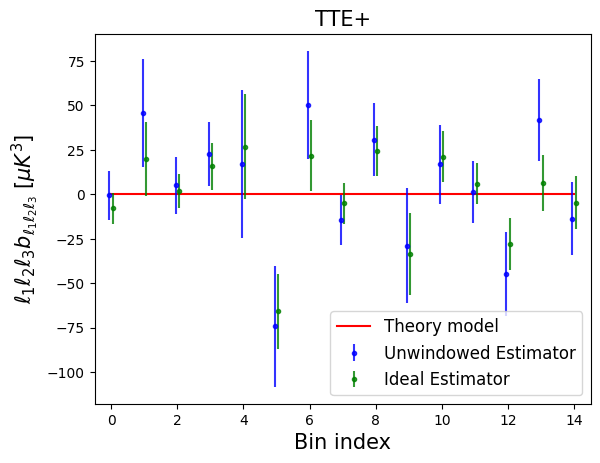

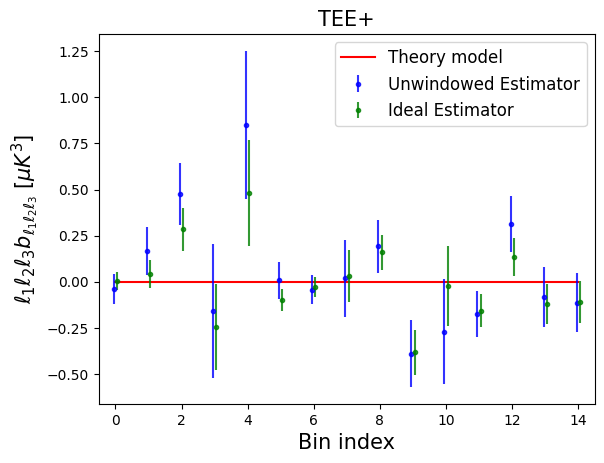

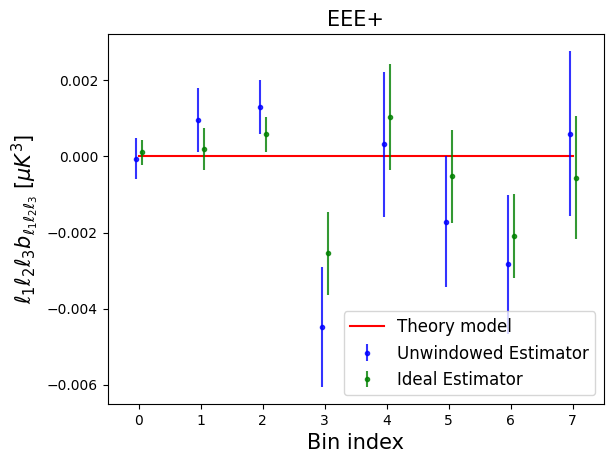

In [31]:
index = 0
for i,f in enumerate(b_ideal.keys()):
    
    ells_sum = np.product([base.parities[ff] for ff in f[:-1]])*int('%s'%f[-1]+'1')
    
    # Define weights and model
    l1s,l2s,l3s = np.asarray(bspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*1e18
    bl_model = np.product([b_input_fac([l1s,l2s,l3s][i])[base.indices[f[i]]] for i in range(3)],axis=0)
    
    plt.figure()
    x_arr = np.arange(len(bl_model))
    if ells_sum==1:
        plt.plot(x_arr,weights*bl_model,label='Theory model',c='r')
    else:
        plt.plot(x_arr,0*weights*bl_model,label='Theory model',c='r')
    plt.errorbar(x_arr-0.05,weights*np.mean(b_unwindowed_all[f],axis=0),yerr=weights*np.std(b_unwindowed_all[f],axis=0)/np.sqrt(N_sim),marker='.',ls='',label='Unwindowed Estimator',c='b',alpha=0.8)
    plt.errorbar(x_arr+0.05,weights*np.mean(b_ideal_all[f],axis=0),yerr=weights*np.std(b_ideal_all[f],axis=0)/np.sqrt(N_sim),ls='',marker='.',label='Ideal Estimator',alpha=0.8,c='g')
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\ell_1\ell_2\ell_3b_{\ell_1\ell_2\ell_3}\,\,[\mu K^3]$',fontsize=15)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)

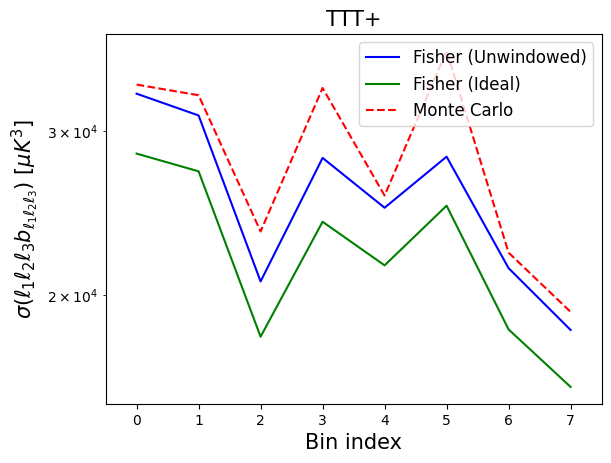

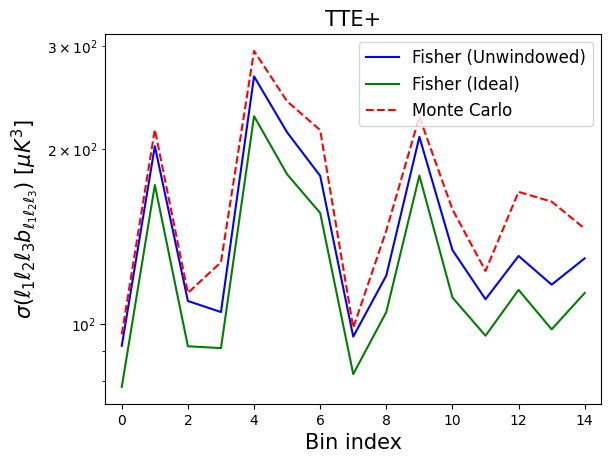

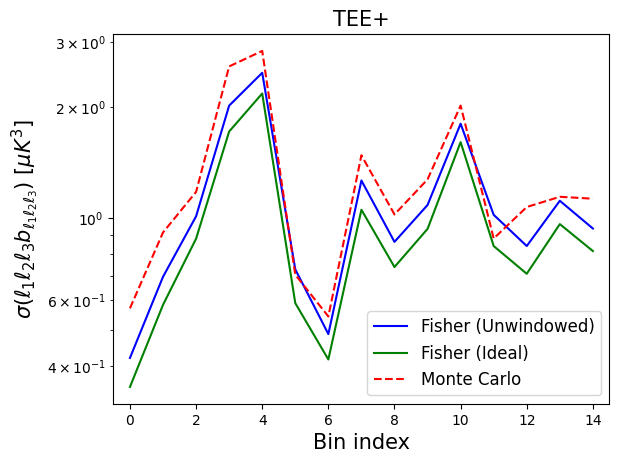

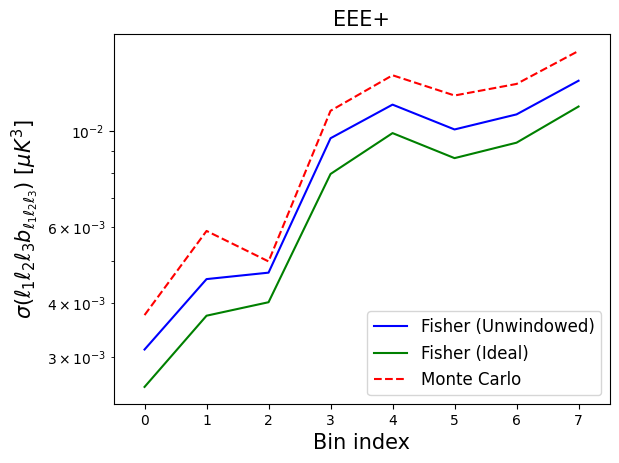

In [32]:
index = 0
for i,f in enumerate(b_ideal.keys()):
    
    ells_sum = np.product([base.parities[ff] for ff in f[:-1]])*int('%s'%f[-1]+'1')
    
    # Define weights
    l1s,l2s,l3s = np.asarray(bspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*1e18
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(bspec.inv_fish)[index:index+len(weights)])
    fish_err_ideal = np.sqrt(np.diag(bspec.inv_fish_ideal)[index:index+len(weights)])*np.sqrt(np.mean(mask**6.)/np.mean(mask**3)**2)
    index += len(weights)
    
    plt.figure()
    x_arr = np.arange(len(fish_err))
    plt.plot(x_arr,weights*fish_err,label='Fisher (Unwindowed)',c='b')
    plt.plot(x_arr,weights*fish_err_ideal,label=r'Fisher (Ideal)',c='g')
    plt.plot(x_arr,weights*np.asarray(b_unwindowed_all[f]).std(axis=0),label='Monte Carlo',c='r',ls='--')
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\sigma(\ell_1\ell_2\ell_3b_{\ell_1\ell_2\ell_3})\,\,[\mu K^3]$',fontsize=15);
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)
    plt.yscale('log')

Finally we compare the correlation structure of the estimator to the inverted Fisher matrix; this is noise-dominated, but shows good overall agreement if we use more simulations.

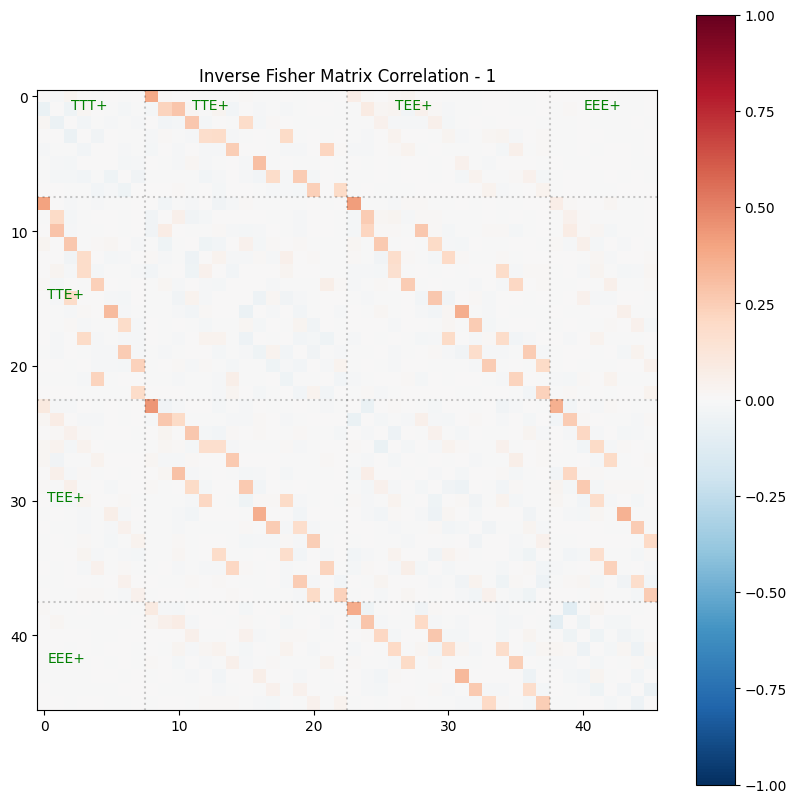

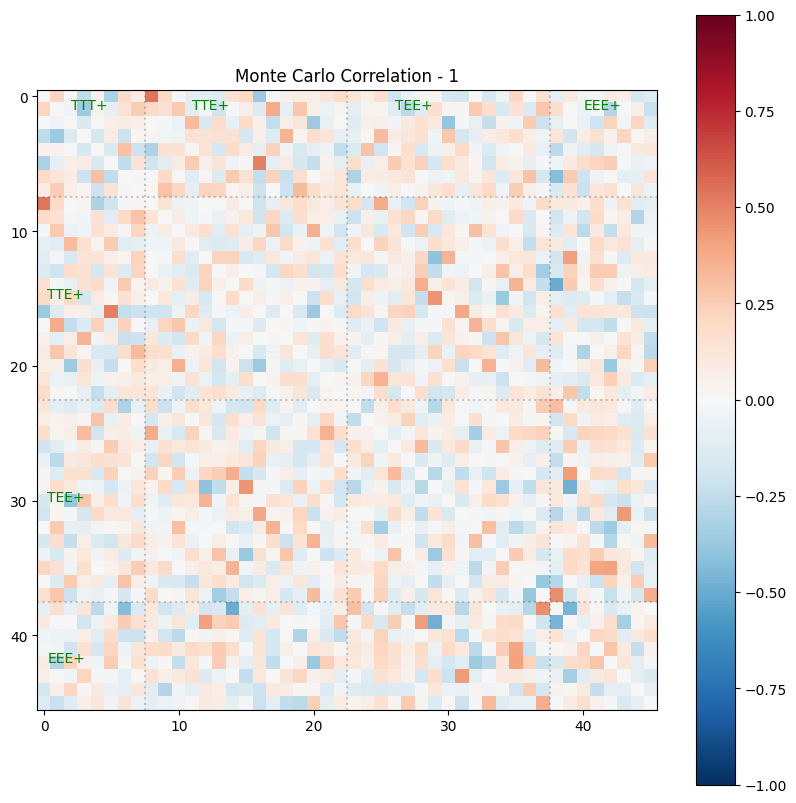

In [33]:
cov_ideal = np.cov(np.hstack([b_unwindowed_all[f] for f in b_ideal.keys()]).T)
plot_bis_correlation(np.linalg.inv(bspec.fish), title='Inverse Fisher Matrix Correlation - 1', v=1.)
plot_bis_correlation(cov_ideal, title='Monte Carlo Correlation - 1', v=1.)

# 4. Trispectrum Estimation

Finally, we consider the trispectrum. This is computed in a similar way to before, again involving both parity-even and parity-odd contributions. In this case, parity-odd physics can lead to a non-trivial temperature four-point function in the presence of rotational symmetries (unlike for the bispectrum). There's a lot of combinations of $T,E,B$ modes we can use here: the full set is $[TTTT,TTTE,TTEE,TTBB,TETE,TEEE,TEBB,TBTB,TBEB,EEEE,EEBB,EBEB,BBBB,TTTB,TTEB,TETB,TEEB,TBEE,TBBB,EEEB,EBBB]$.

Since trispectrum estimation is considerably more expensive than power spectrum or bispectrum estimation, we'll use very low $\ell_{\rm max}$. In general, calculations would be performed on a cluster, but we'll pick a small problem below for testing on a single computer with limited memory.

In [34]:
# Initialize trispectrum class and pick binning
l_bins_raw = np.arange(12,42,10)
# We could also use a non-linear binning: the scaling of the option below gives roughly equal (S/N)^2 per bin
# l_bins_raw = np.asarray(5+np.arange(0,70**0.4,2**0.4)**2.5,dtype='int')

# Let's also use slightly lower l_max for collapsed and unsqueezed configurations
l_bins_squeeze = l_bins_raw.copy()
L_bins = l_bins_raw.copy()[:-1]
l_bins = l_bins_raw.copy()[:-1]

In [35]:
# Define class, using the chosen S^-1 filtering
if pol:
    # For testing, we'll use all T- and E- mode trispectra
    tspec = ps.TSpecBin(base, mask, Sinv_ideal, l_bins, l_bins_squeeze=l_bins_squeeze, L_bins=L_bins, 
                        include_partial_triangles=include_partial_triangles,
                        fields=['TTTT','TTTE','TTEE','TETE','TEEE','EEEE'], parity='both')
else:
    tspec = ps.TSpecBin(base, mask, Sinv_ideal, l_bins, l_bins_squeeze=l_bins_squeeze, L_bins=L_bins, 
                        include_partial_triangles=include_partial_triangles,
                        fields=['TTTT'], parity='both')    

Binning: 1 bins in [12, 22]
Squeezed binning: 2 bins in [12, 32]
L binning: 1 bins in [12, 22]
Mask: spatially varying


In [36]:
# Define centers of l1, l2, l3, l4, L bins
l1s,l2s,l3s,l4s,Ls = tspec.get_ells('TTTT')
print("Using %d bins in total"%len(l1s))

# Print out a few bin centers:
for i in range(min(len(l1s),5)):
    print("Bin %d: l1 = %d, l2 = %d,l3 = %d, l4=%d, L=%d"%(i,l1s[i],l2s[i],l3s[i],l4s[i],Ls[i]))

Using 3 bins in total
Bin 0: l1 = 17, l2 = 17,l3 = 17, l4=17, L=17
Bin 1: l1 = 17, l2 = 17,l3 = 17, l4=27, L=17
Bin 2: l1 = 17, l2 = 27,l3 = 17, l4=27, L=17


### Ideal Estimator

As before, we start by computing the ideal trispectrum. The numerator has similar computational scaling to the bispectrum, but involves a few more spherical harmonic transforms, to account for the $L$ diagonal vector. The ideal estimator computes the normalization internally via a sum over a selection of Wigner $3j$ and $6j$ matrices: notably this is not diagonal, unlike for the power spectrum and bispectrum. Computation may take a while if $\ell_{\rm max}$ is large -- as such, we recommend using the unwindowed routine in any real analysis!

As before, the estimator spits out a dictionary with trispectra for all combinations of fields specified on initialization, and (optionally) both even- and odd-parity physics.

Before computing the ideal spectra, the code will compute the ideal Fisher matrix. This may be computationally expensive for large $\ell_{\rm max}$, and can be optionally multiprocessed.

In [37]:
# Generate data
data = mask*base.generate_data(seed=42, add_B=False)

t_ideal = tspec.Tl_ideal(data, verb=True, N_cpus=N_cpus)



Computing ideal Fisher matrix
Using a total of 56 bins
Multiprocessing computation on 4 cores


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [31:40<00:00, 67.89s/it]


Fisher matrix computation complete


Computing H maps
Computing A_lm fields
Computing empirical power spectra
Assembling 2- and 0-field trispectrum numerator
Computing partial l-summations


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 113.80it/s]

Assembling output



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 1563.85it/s]


Assembling trispectrum numerator
Analyzing trispectrum numerator for field TTTT
Analyzing trispectrum numerator for field TTTE
Analyzing trispectrum numerator for field TTEE
Analyzing trispectrum numerator for field TETE
Analyzing trispectrum numerator for field TEEE
Analyzing trispectrum numerator for field EEEE


Let's look at the structure of the Fisher matrices:

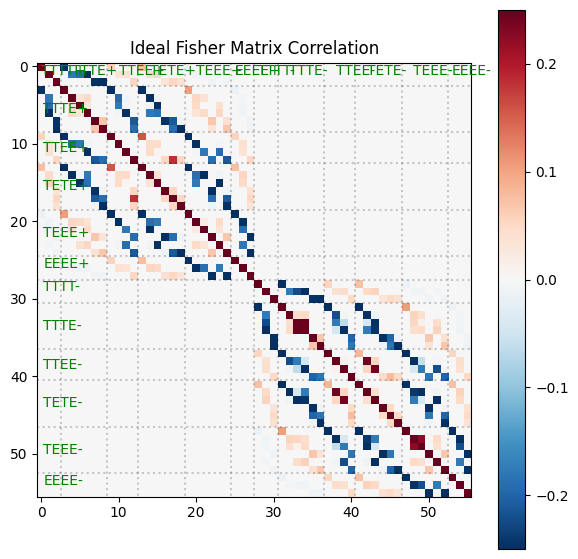

In [38]:
def plot_tri_correlation(matrix,v=0.5,title='',remove_diagonal=True, size_rescaling=1):
    # Define correlation
    corr_matrix = matrix/np.sqrt(np.outer(np.diag(matrix),np.diag(matrix)))

    # Plot matrix
    plt.figure(figsize=(7*size_rescaling,7*size_rescaling))
    plt.imshow(corr_matrix-remove_diagonal*np.eye(len(corr_matrix)),cmap=cm.RdBu_r,vmax=v,vmin=-v)
    plt.title(title)
    plt.colorbar();
    
    i1 = 0
    for i in range(len(t_ideal.keys())):
        plt.hlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.2)
        plt.vlines(i1-0.5,-0.5,len(matrix),linestyles=':',color='k',alpha=0.2)
        i1 += len(tspec.sym_factor_all[i])
    i1 = 0.
    for i in range(len(t_ideal.keys())):
        plt.text(i1+len(tspec.sym_factor_all[i])//4,len(matrix)*0.02,list(t_ideal.keys())[i],c='g')
        i1 += len(tspec.sym_factor_all[i])
    i1 = 0.
    for i in range(len(t_ideal.keys())):
        if i>0: plt.text(len(matrix)*0.005,i1+len(tspec.sym_factor_all[i])//2,list(t_ideal.keys())[i],c='g')
        i1 += len(tspec.sym_factor_all[i])
    plt.xlim(-0.5,len(matrix)-0.5)
    plt.ylim(len(matrix)-0.5,-0.5)

plot_tri_correlation(tspec.fish_ideal, v=0.25, title='Ideal Fisher Matrix Correlation', remove_diagonal=False)

These are not quite diagonal, even for auto-trispectra (if we use enough bins)! This occurs since there are two choices of tetrahedron diagonal, so the same shape contributes to multiple bins.

### Window-free estimator
Computing the window-free trispectrum proceeds similarly to the bispectrum, and once again requires a mask-dependent Fisher matrix to remove the leakage between bins.

Here, we require a set of pairs of simulations to form the 2- and 0-field terms in the trispectrum estimator (i.e. those involving $dd\langle{dd\rangle}$ and $\langle{dd\rangle}\langle{dd\rangle}$). Unlike for the bispectrum, these are (usually) *necessary*: the output trispectrum will be biased if we do not remove the Gaussian pieces. As before, these can be generated by the code or read-in from some external source. They should have the same covariance (i.e. two-point) function as the data, but can differ for higher-point functions.

Similar to the bispectrum computation, we load all simulations into memory , then compute the trispectra. If memory usage is a concern, one can set ```preload=False```, which loads one simulation at a time when needed. The simulation harmonic transforms are not saved in this mode, so must be recomputed for each new dataset analyzed.

Let's start by computing the Fisher matrix and then the full trispectrum. We'll compute quantities for both parities simultaneously. This might take a while... (we'd usually run it on a cluster, potentially using a high-memory node).

In [39]:
# Generate MC simulations for estimator numerator
# We've used more MC iterations here than before, since the parity-even trispectrum needs an accurate two-point term
tspec.generate_sims(5*N_it//2, preload=True, verb=True)

# # Alternatively, read-in pairs of MC simulations created externally
# def load_sim_pair(ii):
#     """This function loads and returns a single pair of simulation"""
#     sim1 = mask*base.generate_data(seed=int(1e5)+ii,add_B=False,output_type='map')
#     sim2 = mask*base.generate_data(seed=int(2e5)+ii,add_B=False,output_type='map')
#     return [sim1, sim2]
# tspec.load_sims(load_sim_pair, 5*N_it//2, preload=True, verb=True, input_type='map')

Using 25 pairs of Monte Carlo simulations
Generating bias simulation pair 1 of 25
Generating bias simulation pair 6 of 25
Generating bias simulation pair 11 of 25
Generating bias simulation pair 16 of 25
Generating bias simulation pair 21 of 25


In [40]:
# Zero counters (for diagnostics only)
base.n_SHTs_forward, base.n_SHTs_reverse = 0, 0

# Compute the Fisher matrix
fish = tspec.compute_fisher(N_it, verb=True)

# Compute the unwindowed estimator, optionally removing disconnected contributions (2- and 0-field terms)
t_unwindowed = tspec.Tl_unwindowed(data, verb=True, include_disconnected_term=True)

# Print some diagnostics
print("Computation complete using %d forward and %d reverse SHTs"%(base.n_SHTs_forward, base.n_SHTs_reverse))

Computing Fisher contribution 1 of 10
# Generating GRFs

# Computing Q4 map for S^-1 weighting
Weighting maps
Creating H maps
Allocating 0.74 GB of memory
Computing field 0,0 and bin 0,0
Computing field 0,0 and bin 0,1
Computing field 0,1 and bin 0,0
Computing field 0,1 and bin 0,1
Computing field 0,1 and bin 1,0
Computing field 1,1 and bin 0,0
Computing field 1,1 and bin 0,1

# Computing Q4 map for A^-1 weighting
Weighting maps
Creating H maps
Allocating 0.74 GB of memory
Computing field 0,0 and bin 0,0
Computing field 0,0 and bin 0,1
Computing field 0,1 and bin 0,0
Computing field 0,1 and bin 0,1
Computing field 0,1 and bin 1,0
Computing field 1,1 and bin 0,0
Computing field 1,1 and bin 0,1
Applying S^-1 weighting to output

# Assembling Fisher matrix

Computing Fisher contribution 2 of 10
Computing Fisher contribution 3 of 10
Computing Fisher contribution 4 of 10
Computing Fisher contribution 5 of 10
Computing Fisher contribution 6 of 10
Computing Fisher contribution 7 of 10
Computi

As before, we can also compute the Fisher matrix externally (e.g., on a cluster) and read it in.

In [41]:
# fish = 0.
# for i in range(N_it):
#     if i%5==0: print("On iteration %d of %d"%(i+1,N_it))
#     fish += tspec.compute_fisher_contribution(i, verb=(i==0))/N_it

# # Compute unwindowed estimator, passing the Fisher matrix
# t_unwindowed = tspec.Tl_unwindowed(data, verb=True, fish=fish, include_disconnected_term=True)

### Plots

Now we can plot!

Once again, trispectra are messy to visualize, so we'll collapse all the data into one dimension for each configuration of fields and plot directly. As before, we'll compare the results from the two estimators, as well as the Fisher matrix. Let's start with the trispectra themselves:

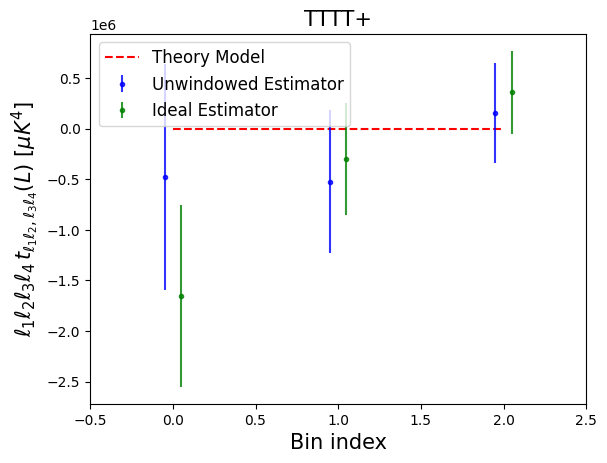

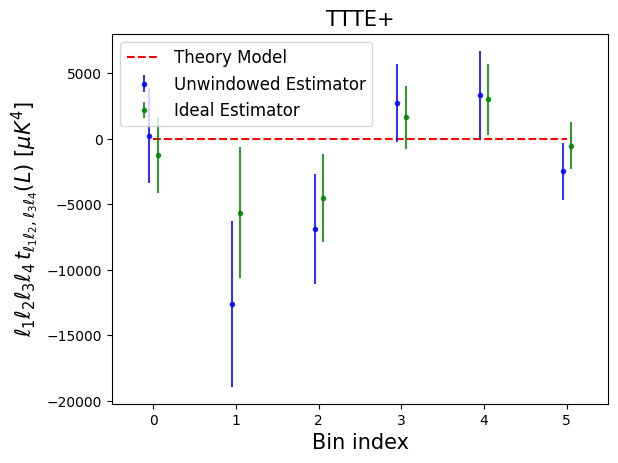

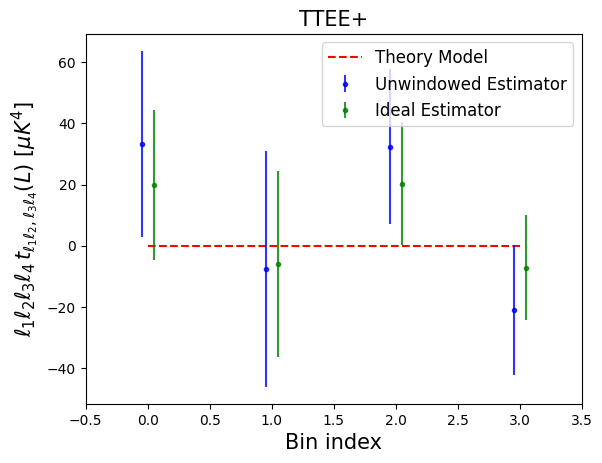

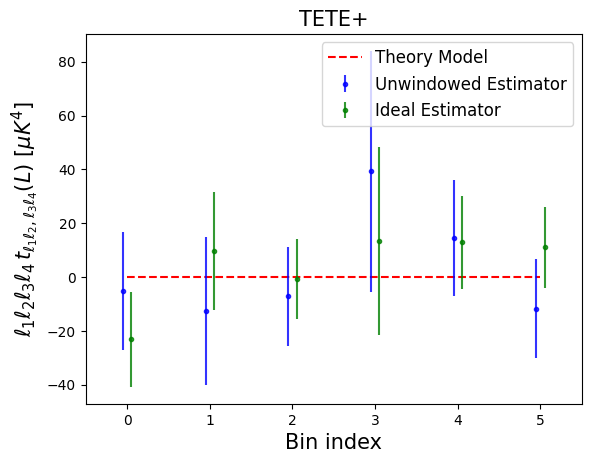

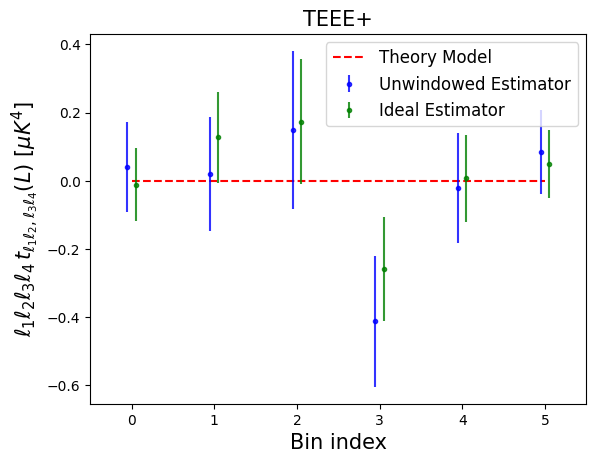

...

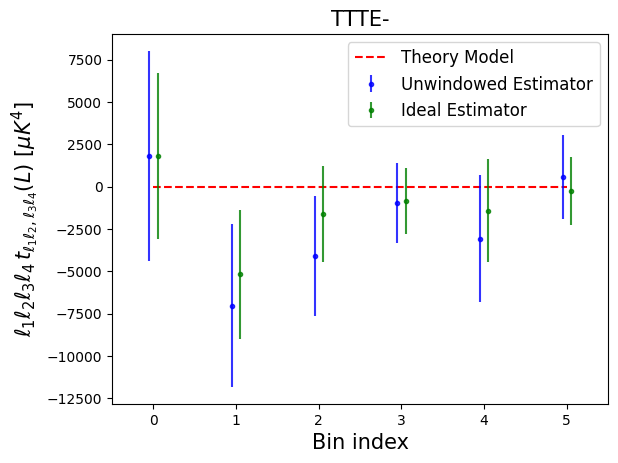

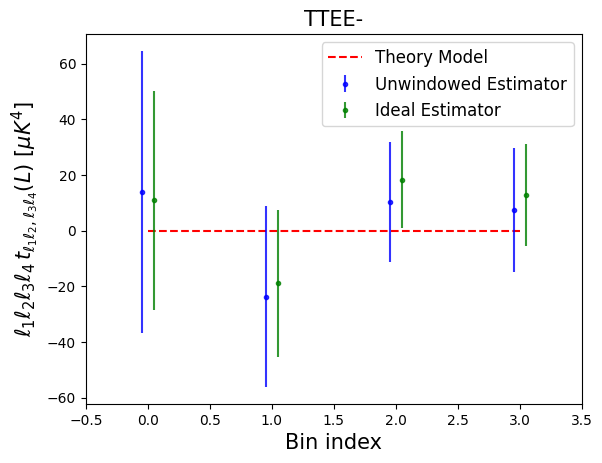

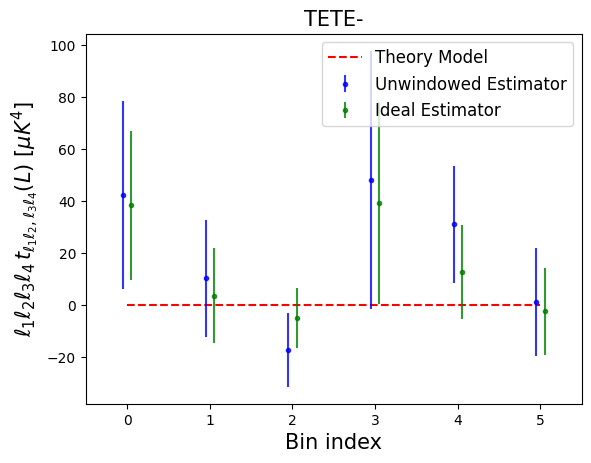

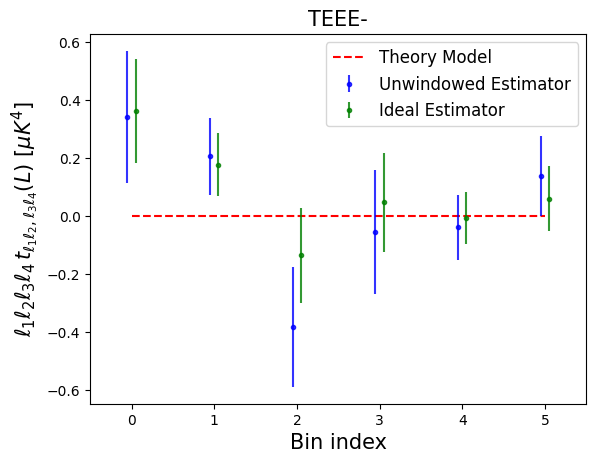

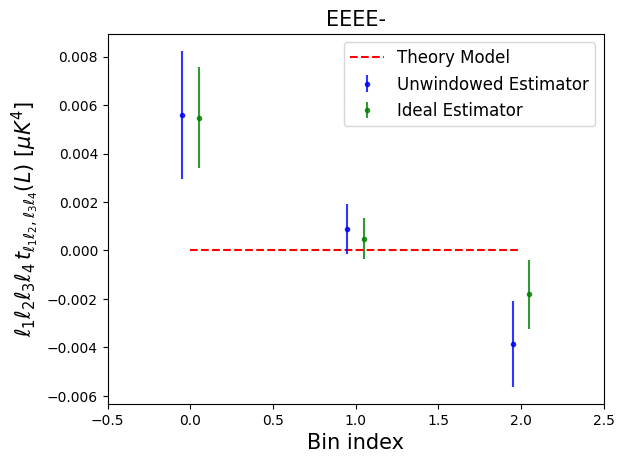

In [42]:
index = 0
for i,f in enumerate(t_ideal.keys()):
    
    # Define weights and model
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*l4s*1e24
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(tspec.inv_fish)[index:index+len(tspec.sym_factor_all[i])])
    fish_err_ideal = np.sqrt(np.diag(tspec.inv_fish_ideal)[index:index+len(tspec.sym_factor_all[i])])*np.sqrt(np.mean(mask**8.)/np.mean(mask**4)**2)
    index += len(tspec.sym_factor_all[i])

    plt.figure()
    x_arr = np.arange(len(fish_err_ideal))
    plt.plot(x_arr, weights*0.,label='Theory Model',c='r',ls='--')
    plt.errorbar(x_arr-0.05,weights*t_unwindowed[f],yerr=weights*fish_err,marker='.',ls='',label='Unwindowed Estimator',c='b',alpha=0.8)
    plt.errorbar(x_arr+0.05,weights*t_ideal[f],yerr=weights*fish_err_ideal,ls='',marker='.',label='Ideal Estimator',alpha=0.8,c='g')
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\ell_1\ell_2\ell_3\ell_4\,t_{\ell_1\ell_2,\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=15)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)

These look reasonable. Note that using too few simulations for the disconnected contributions (those loaded in ```generate_sims``` or ```load_sims```) can increase the variance of the estimator and cause differences between the ideal and unwindowed estimator, even with a uniform mask. Note also that the unwindowed estimator appears to have a larger variance than the ideal estimator when applied to masked data; this is just a result of the latter ignoring bin-to-bin correlations.

Let's look at the Fisher matrix:

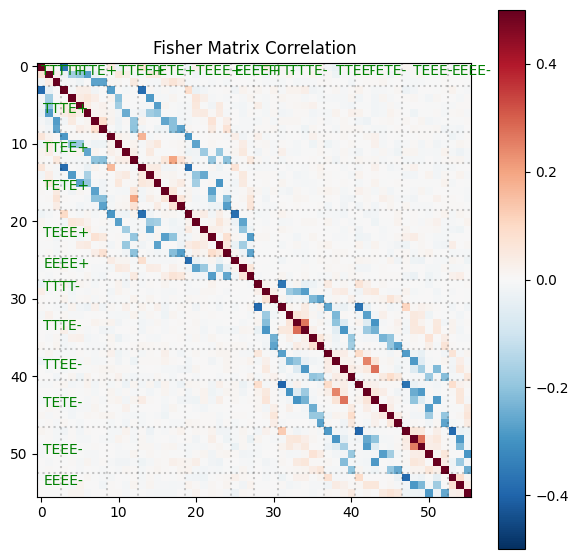

In [43]:
plot_tri_correlation(tspec.fish, v=0.5, title='Fisher Matrix Correlation', remove_diagonal=False)

This has a complex structure due to the mask and the correlation between trispectra with different diagonals.

## Validation

### Gaussian Terms

Validation is a little more tricky for trispectra, since generating data with a non-zero trispectrum is non-trivial. However, we can straightforwardly test the parity-even pieces by comparing the *full* trispectrum (without subtraction of disconnected components) to the Gaussian expectation. For simplicity, we'll look only at the trispectrum numerator (since each component is multiplied by the same Fisher matrix) and iterate over some GRF simulations:

In [44]:
# Define arrays
tC_num = []
t4_num = []
t2_num = []
t0_num = []

# Compute 0-field term
t0 = tspec.t0_num

N_grf = 100
for i in range(N_grf):
    print("\nAnalyzing GRF %d of %d"%(i+1,N_grf))
    grf_data = mask*base.generate_data(seed=i, add_B=False)
    # Connected term
    this_tC = tspec.Tl_numerator(grf_data, verb=(i==0), include_disconnected_term=True)
    # 4-field term
    this_t4 = tspec.Tl_numerator(grf_data, verb=(i==0), include_disconnected_term=False)
    # 2-field term
    this_t2 = this_tC-this_t4-t0
    # Add to arrays
    tC_num.append(this_tC)
    t4_num.append(this_t4)
    t2_num.append(this_t2)
    t0_num.append(t0)


Analyzing GRF 1 of 100
Using precomputed t0 term
Computing H maps
Computing A_lm fields
# Assembling trispectrum numerator (4-field term)
Analyzing 4-field trispectrum numerator for field TTTT
Analyzing 4-field trispectrum numerator for field TTTE
Analyzing 4-field trispectrum numerator for field TTEE
Analyzing 4-field trispectrum numerator for field TETE
Analyzing 4-field trispectrum numerator for field TEEE
Analyzing 4-field trispectrum numerator for field EEEE
# Assembling 2-field trispectrum numerator for simulation pair 1 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 2 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 3 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 4 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 5 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 6 of 25 
# Assembling 2-field trispectrum numerator for simulation pair 7 of 25 
# Assembling 2-field trispe

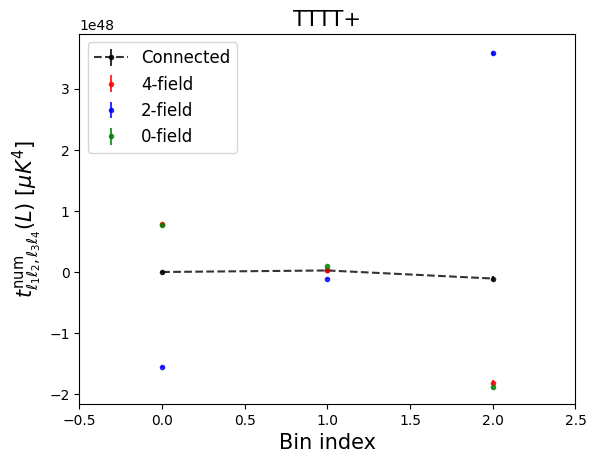

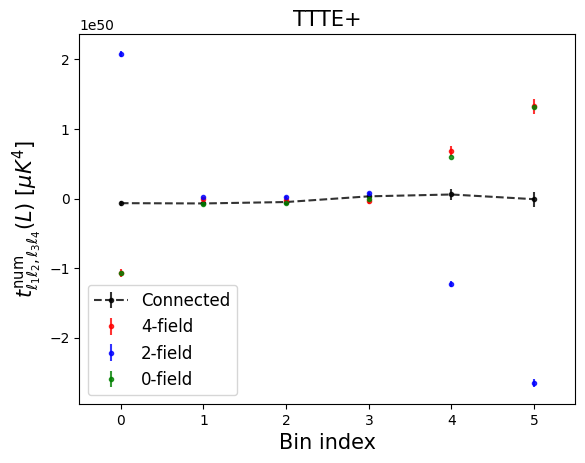

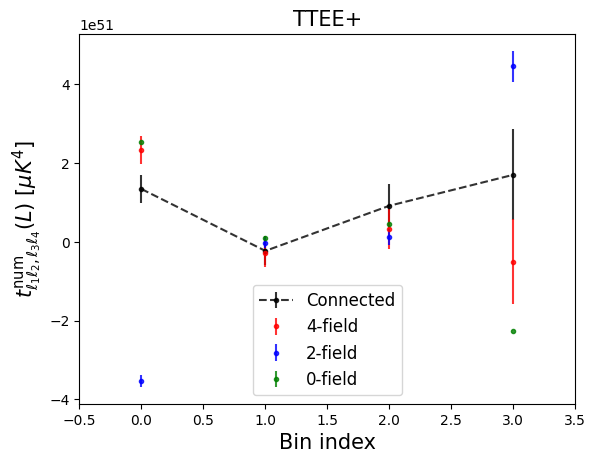

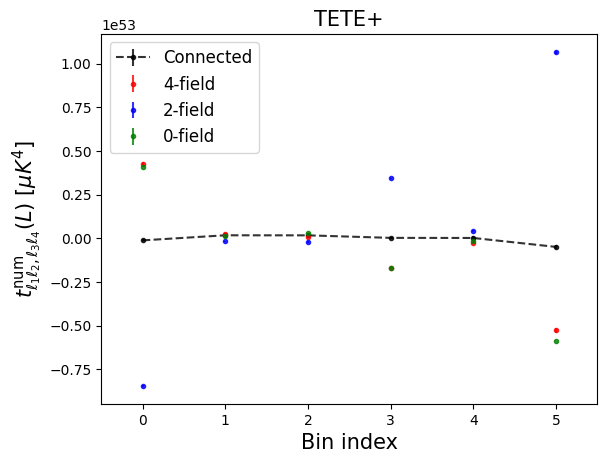

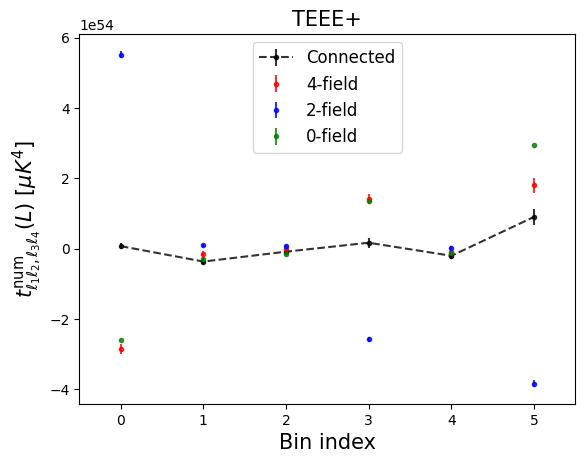

...

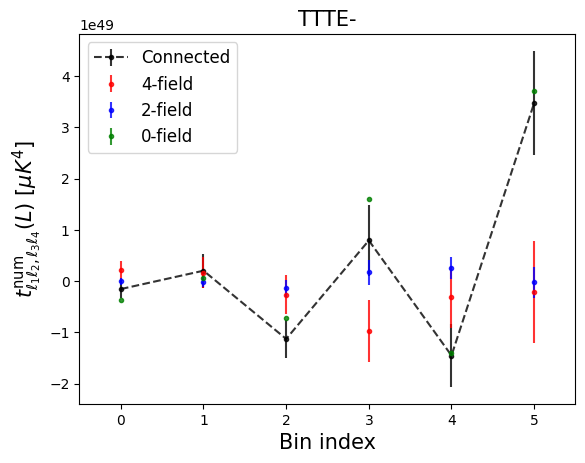

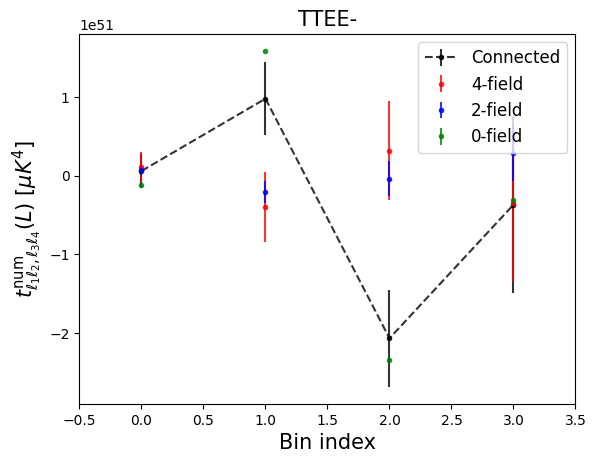

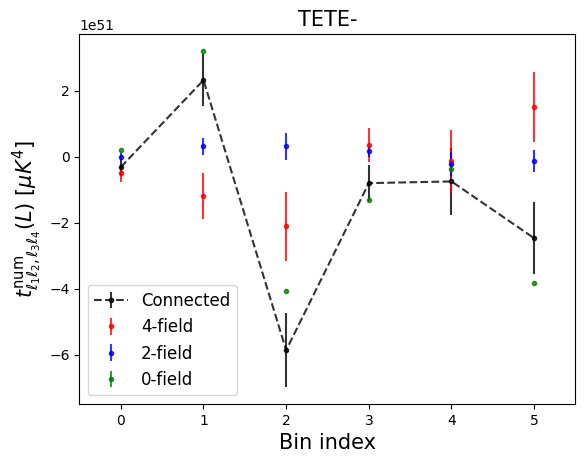

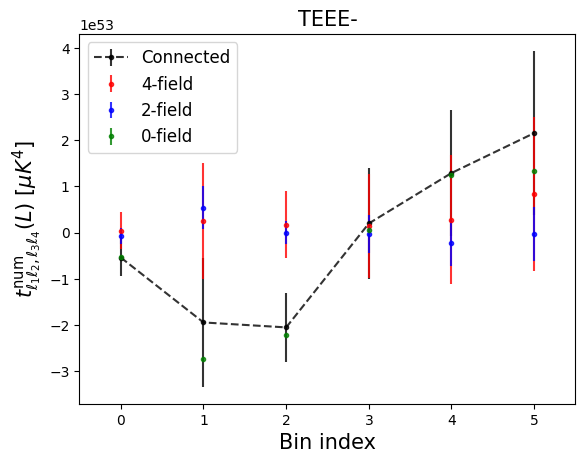

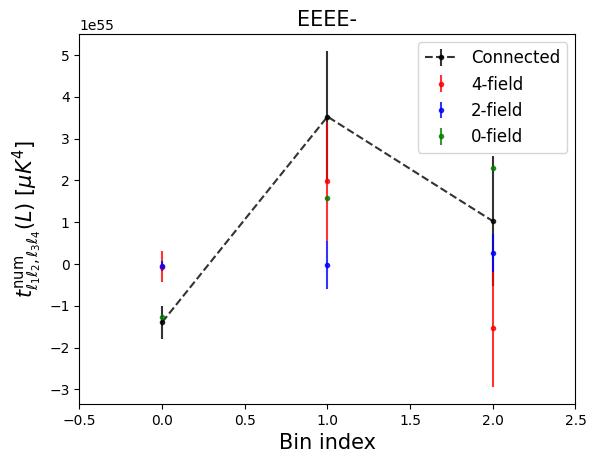

In [45]:
index = 0
for i,f in enumerate(t_ideal.keys()):
    
    # Define weights and model
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=f[:-1]))
    weights = 1e24*(1.+0.*l1s)
    
    # Define indices
    ind = np.arange(index,index+len(tspec.sym_factor_all[i]))
    
    plt.figure()
    x_arr = np.arange(len(ind))
    # Theoretical expectations (only valid without a mask)
    if np.abs(np.mean(mask)-1.)<1e-4:
        plt.plot(x_arr,weights*tspec.t0_num_ideal[ind],c='r',alpha=0.5)
        plt.plot(x_arr,weights*-2*tspec.t0_num_ideal[ind],c='b',alpha=0.5)
        plt.plot(x_arr,weights*tspec.t0_num_ideal[ind],c='g',alpha=0.5)
        plt.plot(x_arr,weights*0.,c='k',alpha=0.5)
    # Data
    plt.errorbar(x_arr,weights*np.mean(tC_num,axis=0)[ind],yerr=weights*np.std(tC_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='--',label='Connected',c='k',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(t4_num,axis=0)[ind],yerr=weights*np.std(t4_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='4-field',c='r',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(t2_num,axis=0)[ind],yerr=weights*np.std(t2_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='2-field',c='b',alpha=0.8)
    plt.errorbar(x_arr,weights*np.mean(t0_num,axis=0)[ind],yerr=weights*np.std(t0_num,axis=0)[ind]/np.sqrt(N_grf),marker='.',ls='',label='0-field',c='g',alpha=0.8)
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$t^{\mathrm{num}}_{\ell_1\ell_2,\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=15)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)
   
    
    index += len(tspec.sym_factor_all[i])

For parity-conserving spectra, we note that the $4$-field term is approximately equal to the $0$-field term, and $-(1/2)\times$ the $2$-field term, each of which is close to the theoretical expectation (solid lines, if the mask is set to unity). This is as expected, and the sum cancels (up to noise). For parity-breaking spectra, there is no net contribution from any term. Notably there is some scatter in the zero-field terms: this converges as $N^{-1/2}_{\rm it}$ when $N_{\rm it}$ Monte Carlo terms are used.

Finally, we note that this is a sufficient test also for parity-odd spectra, since they are formulated in exactly the same manner, except with a restriction to $p_u(-1)^{\ell_1+\ell_2+\ell_3+\ell_4}=-1$ instead of $+1$.

### Iterate over multiple data-sets

Just as before, we can test the estimator covariances with some mock data. This remains (comparatively) cheap, since we don't need to reload Monte Carlo simulations or recompute the Fisher matrix.

In [46]:
# Set counters to zero
base.n_SHTs_forward, base.n_SHTs_reverse = 0, 0

# Define arrays
t_unwindowed_all = {f:[] for f in t_ideal.keys()}
t_ideal_all = {f:[] for f in t_ideal.keys()}

for jj in range(N_sim):
    
    if jj%10==0: 
        print("Analyzing simulation %d of %d"%(jj+1,N_sim))

    # Generate unmasked data
    data = mask*base.generate_data(jj,add_B=False)
    
    # Analyze sim
    this_Tl_ideal = tspec.Tl_ideal(data, verb=False)
    this_Tl_unwindowed = tspec.Tl_unwindowed(data, verb=False)
    
    # Add to arrays
    for f in t_ideal.keys():
        t_ideal_all[f].append(this_Tl_ideal[f])
        t_unwindowed_all[f].append(this_Tl_unwindowed[f])
    
# Print some diagnostics
print("Computation complete using %d forward and %d reverse SHTs per simulation"%(base.n_SHTs_forward//N_sim, base.n_SHTs_reverse//N_sim))

Analyzing simulation 1 of 50
Analyzing simulation 11 of 50
Analyzing simulation 21 of 50
Analyzing simulation 31 of 50
Analyzing simulation 41 of 50
Computation complete using 1096 forward and 14 reverse SHTs per simulation


Below, we plot the various components, averaged over the realizations, and then their errors. As expected, the results are consistent with zero in all cases (though we caution that deviations will appear if one uses too few simulations in the estimator, which does not show up in the variances). Moreover, the variance of the unwindowed estimators is close to the Fisher matrix, showing that things are close to optimal. As before, the ideal estimators seem to have lower variance; this is due to the correlations between adjacent bins, and does not lead to increased signal-to-noise.

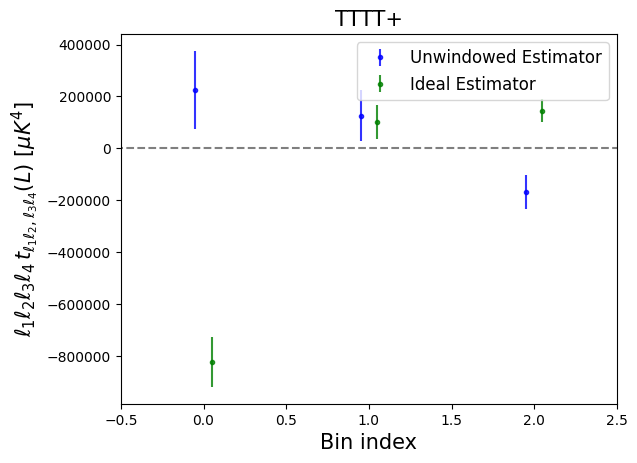

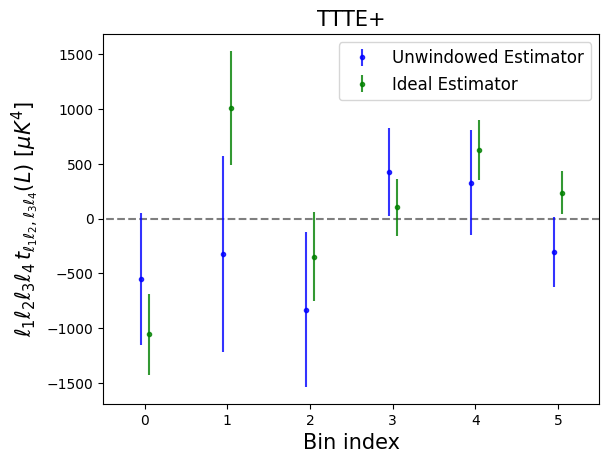

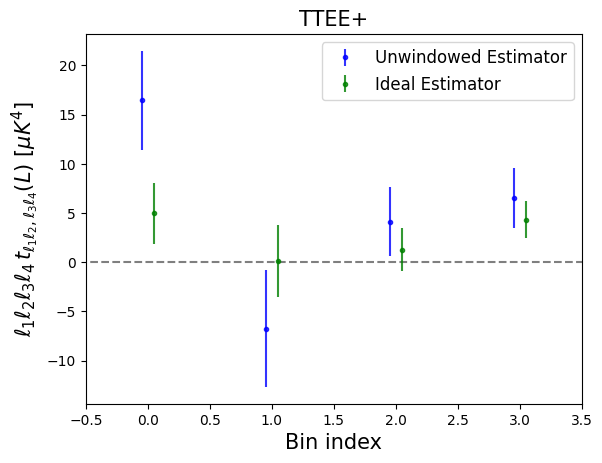

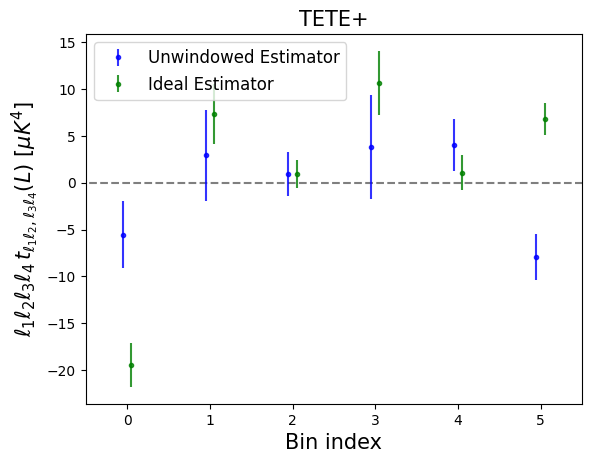

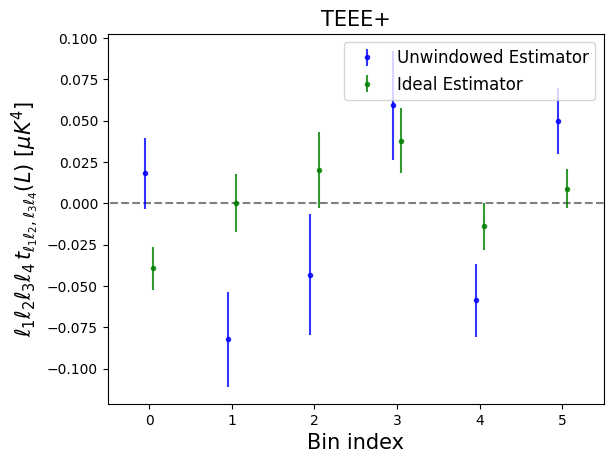

...

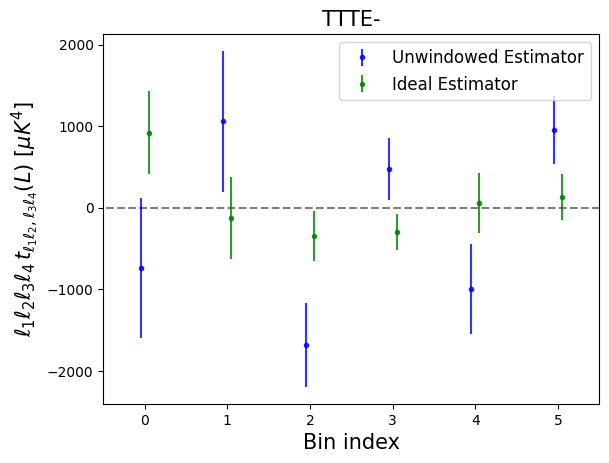

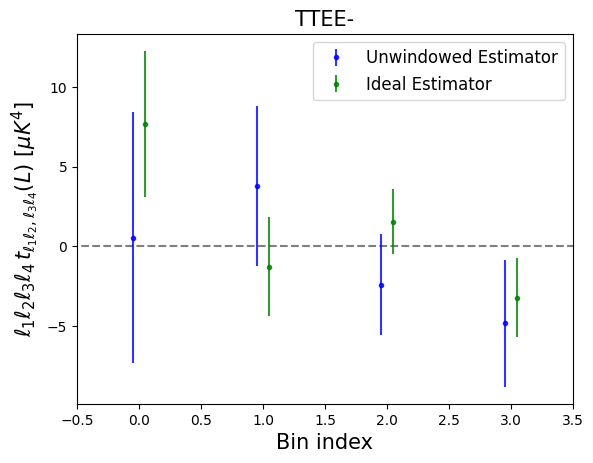

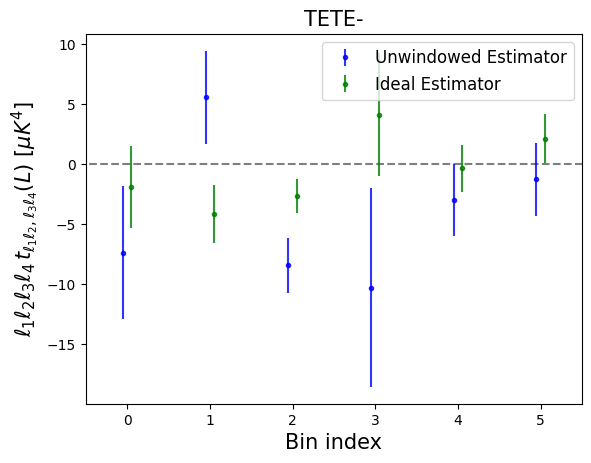

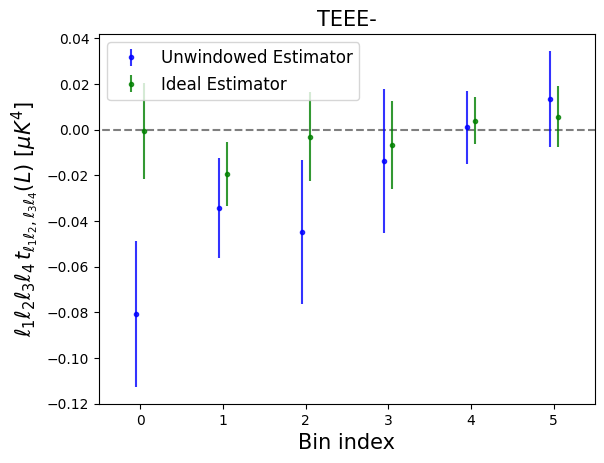

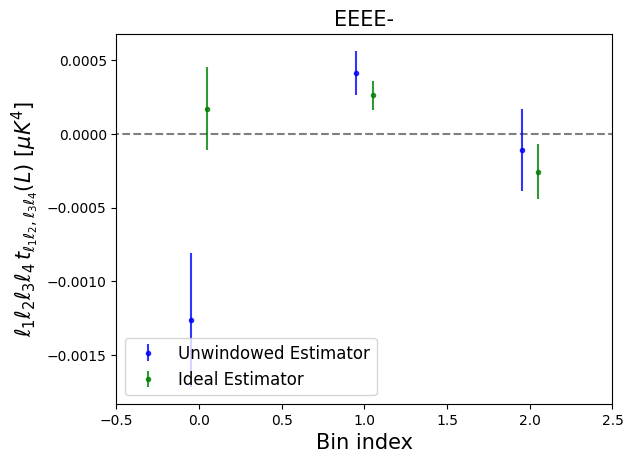

In [47]:
index = 0
for i,f in enumerate(t_ideal.keys()):
    
    # Define weights
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*l4s*1e24
    
    # Plot means
    plt.figure()
    x_arr = np.arange(len(tspec.sym_factor_all[i]))
    plt.hlines(0,-1,len(x_arr)+1,linestyles='--',color='k',alpha=0.5)
    plt.errorbar(x_arr-0.05,weights*np.mean(t_unwindowed_all[f],axis=0),yerr=weights*np.std(t_unwindowed_all[f],axis=0)/np.sqrt(N_sim),marker='.',ls='',label='Unwindowed Estimator',c='b',alpha=0.8)
    plt.errorbar(x_arr+0.05,weights*np.mean(t_ideal_all[f],axis=0),yerr=weights*np.std(t_ideal_all[f],axis=0)/np.sqrt(N_sim),ls='',marker='.',label='Ideal Estimator',alpha=0.8,c='g')
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\ell_1\ell_2\ell_3\ell_4\,t_{\ell_1\ell_2,\ell_3\ell_4}(L)\,\,[\mu K^4]$',fontsize=15)
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)

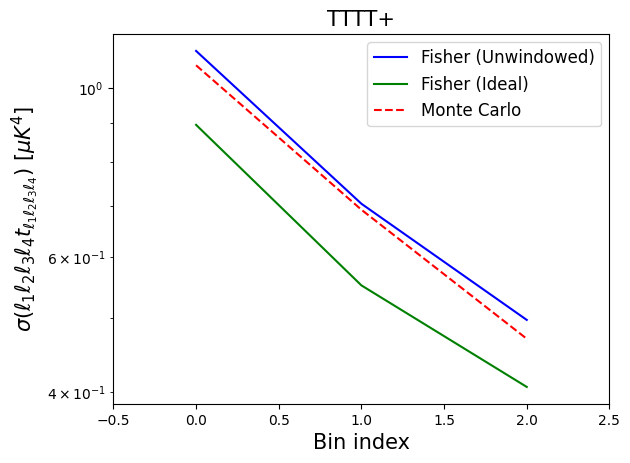

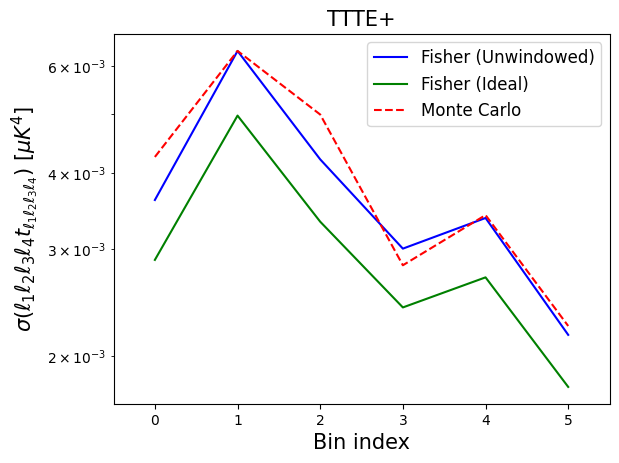

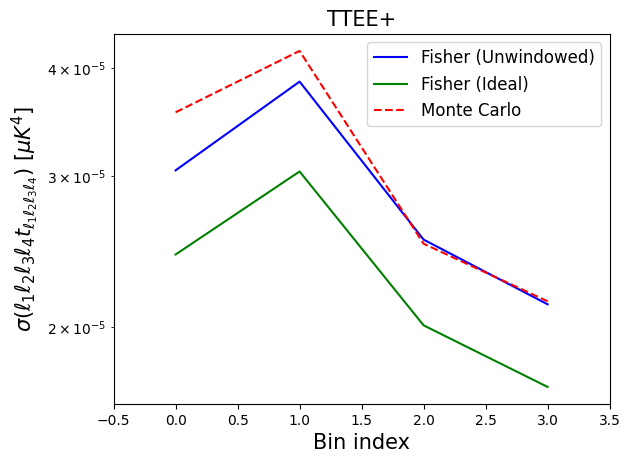

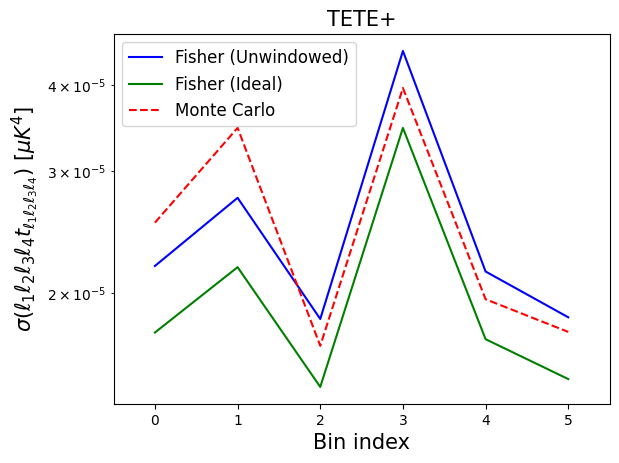

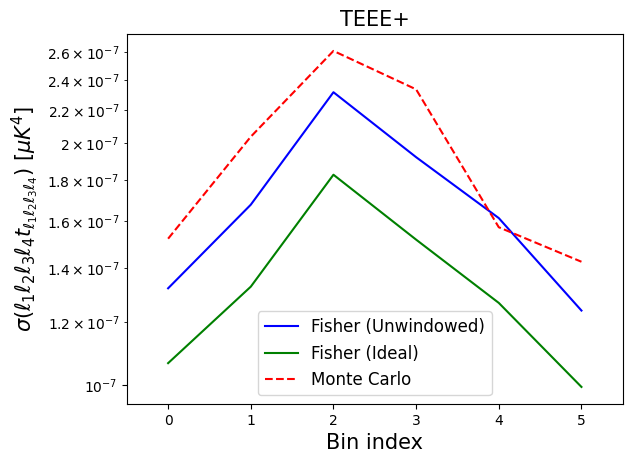

...

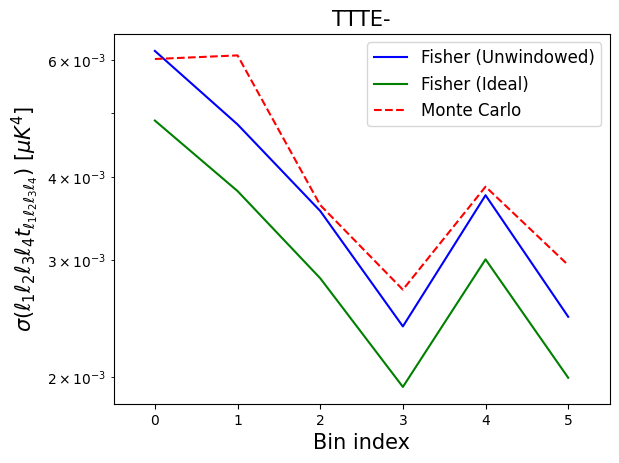

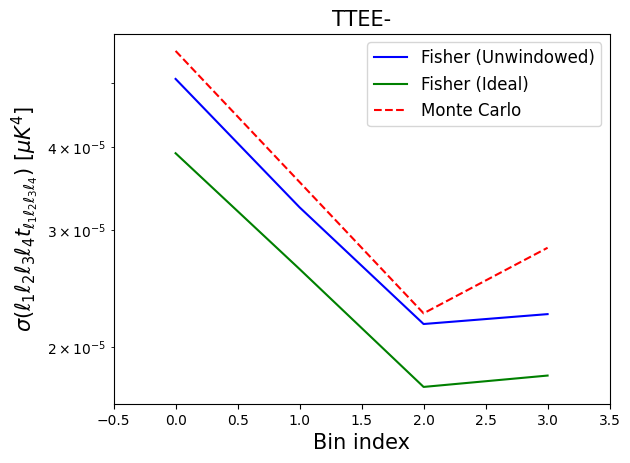

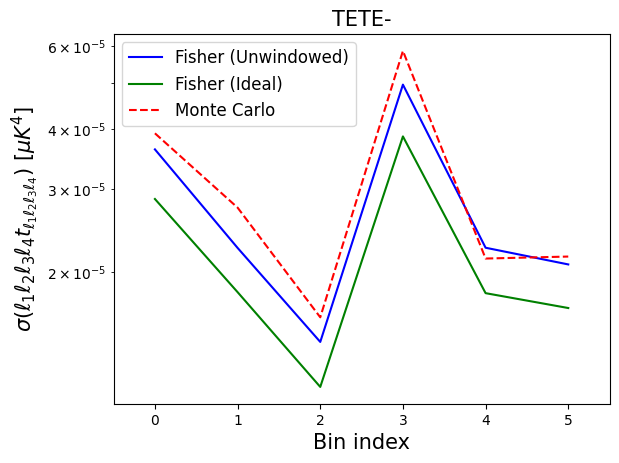

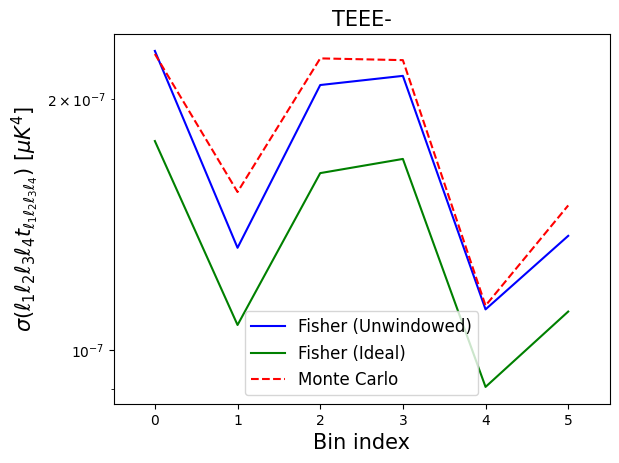

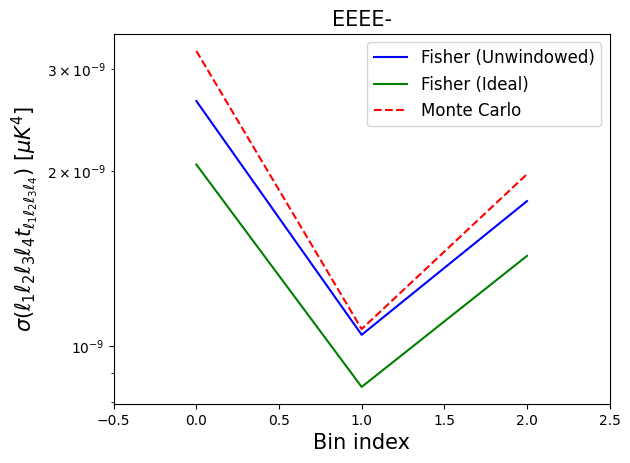

In [48]:
index = 0
for i,f in enumerate(t_ideal.keys()):
    
    # Define weights
    l1s,l2s,l3s,l4s,Ls = np.asarray(tspec.get_ells(field=f[:-1]))
    weights = l1s*l2s*l3s*l4s*1e18
    
    # Fisher Error
    fish_err = np.sqrt(np.diag(tspec.inv_fish)[index:index+len(tspec.sym_factor_all[i])])
    fish_err_ideal = np.sqrt(np.diag(tspec.inv_fish_ideal)[index:index+len(tspec.sym_factor_all[i])])*np.sqrt(np.mean(mask**6.)/np.mean(mask**3)**2)
    index += len(tspec.sym_factor_all[i])
    
    # Plot errors
    plt.figure()
    x_arr = np.arange(len(fish_err))
    plt.plot(x_arr,weights*fish_err,label='Fisher (Unwindowed)',c='b')
    plt.plot(x_arr,weights*fish_err_ideal,label=r'Fisher (Ideal)',c='g')
    plt.plot(x_arr,weights*np.asarray(t_unwindowed_all[f]).std(axis=0),label='Monte Carlo',c='r',ls='--')
    plt.xlabel(r'Bin index',fontsize=15)
    plt.ylabel(r'$\sigma(\ell_1\ell_2\ell_3\ell_4t_{\ell_1\ell_2\ell_3\ell_4})\,\,[\mu K^4]$',fontsize=15);
    plt.xlim([-0.5,len(x_arr)-0.5])
    plt.legend(fontsize=12)
    plt.title('%s'%f, fontsize=15)
    plt.yscale('log')

Finally we compare the correlation structure of the estimator to the inverted Fisher matrix; this is noisy, but shows good overall agreement.

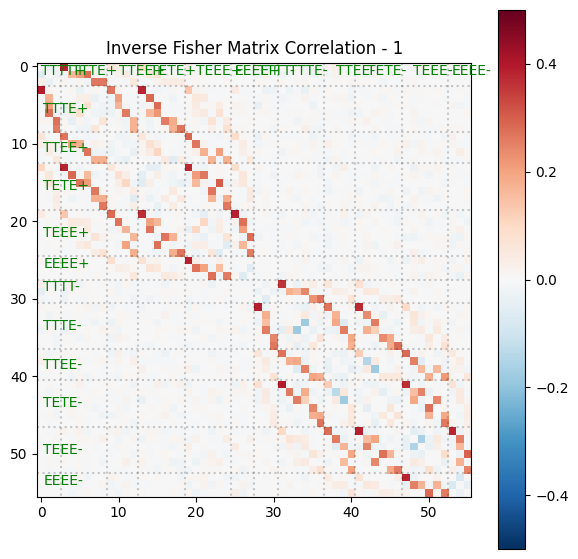

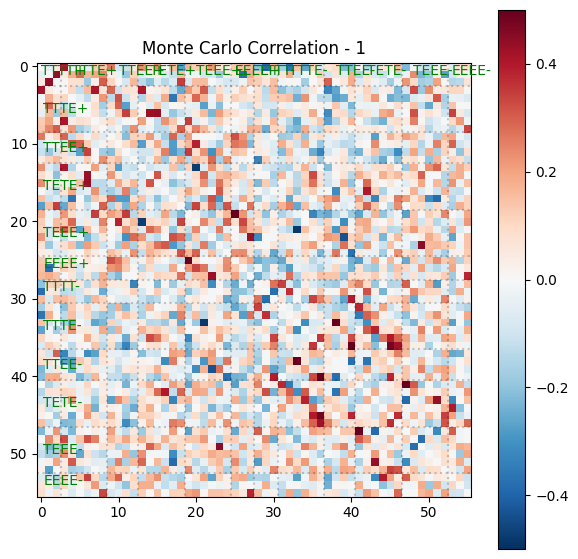

In [49]:
cov_ideal = np.cov(np.hstack([t_unwindowed_all[f] for f in t_ideal.keys()]).T)
plot_tri_correlation(np.linalg.inv(tspec.fish), title='Inverse Fisher Matrix Correlation - 1', v=0.5)
plot_tri_correlation(cov_ideal, title='Monte Carlo Correlation - 1', v=0.5)

## This computes the tutorial! For any questions, please open a GitHub issue or contact [Oliver Philcox](ohep2@cantab.ac.uk).